# EmoSense
## Understanding Group Emotions through Individual Facial Analysis

### Business Problem
Picture this: You're organizing a company retreat, a school assembly, or perhaps a community gathering. As the organizer, you're keen to ensure everyone is engaged and enjoying themselves. But how can you gauge the collective mood of the group? That's where this project comes in. The aim is to develop a system capable of analyzing group images to identify the emotions of the individuals within them. By employing deep learning models and algorithms, we aim to identify whether the group is demonstrating happiness, enthusiasm, apprehension, or any other emotional state. 

Such a system holds immense potential for various applications. For businesses, it could provide valuable insights into employee satisfaction during team-building events or meetings. In educational settings, it could help educators assess student engagement during lectures or group activities. Even event organizers could leverage this tool to ensure attendees are having a positive experience. Ultimately, by decoding group emotions through visual data, we strive to enhance social dynamics and foster environments favorable to collective well-being and productivity.

### Existing Solution and Limitations
Understanding group emotions from group images is challenging because it involves identifying how each person in the group feels, which can be different for everyone. Traditional methods often treat the whole group as feeling the same way, missing the individual emotions. Also, analyzing group pictures accurately means needing to pick out emotions from both the whole group and each person's face, which can be hard because of different lighting and facial expressions. Plus, emotions can be subtle and vary based on the situation, making it tricky to get it right. Finally, doing this quickly and accurately is important for tasks like managing events or customer interactions.

### Proposed Solution
This project aims to redefine the way we perceive and interpret group emotions by implementing an approach that takes into account the individual emotions within a group. Instead of solely analyzing group images as a whole, our solution involves employing deep learning models to extract emotions of individuals given group images. We strive to create a comprehensive understanding of group emotions that captures the rich diversity of feelings present among group members.

### Deep Learning Problem
We aim to create a pipeline using algorithms or pretrained deep learning models to extract human faces in group images and then identify emotions of each human face. Technically, this is a face detection and classification problem.

## 1. Labeling and EDA on labeled data
I performed the labeling using Label Studio. The expressions I used were those supported by the DeepFace and FER libraries, which are `angry`,
`disgust`, `fear`, `happy`, `neutral`, and `sad`. Some later models also support `contempt`, but I labeled my pictures before discovering those later models. 

While not required, I explore the results of that labeling here. One thing I cannot explore is the quality of my labeling. Ideally, the labeling would be crowd-sourced, as done with the FER+ dataset that I use below, minimizing the mistakes of any single labeler.

### 1.1. Data import

#### 1.1.1. Import label mapping (classes)

In [2]:
import numpy as np

classes_path = 'Labeled/classes.txt'
classes = np.loadtxt(classes_path, dtype=str)
classes

array(['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'],
      dtype='<U8')

#### 1.1.2. Import images, face locations, and labels
The images and the labels for the faces in each image. Note that I saved the label data in the YOLO file format. The format is ```class_id center_x center_y width height```, where the coordinates and the width and height are as a fraction of the image dimensions. Therefore, some conversion will be necessary to use it.

In [1]:
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torchvision

def yolo_boxes_to_cxcywh(yolo_boxes, img_dims):
    """Scales bounding boxes from YOLO fractional image dimension format to pixel units."""
    cxcywh = np.zeros_like(yolo_boxes.to_numpy(), dtype=float)
    cxcywh[:,0] = yolo_boxes['center_x'] * img_dims[0]
    cxcywh[:,1] = yolo_boxes['center_y'] * img_dims[1]
    cxcywh[:,2] = yolo_boxes['width'] * img_dims[0]
    cxcywh[:,3] = yolo_boxes['height'] * img_dims[1]
    return torch.tensor(cxcywh)

label_path = 'Labeled/labels'
img_path = 'Labeled/images'
label_files = os.listdir(label_path)

header = ['class_id', 'center_x', 'center_y', 'width', 'height']
data = []
for file in label_files:
    fdata = {}
    name = file[:-4]
    fdata['name'] = name 
    img_bgr = cv2.imread(img_path + '/' + name + '.jpg')
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    fdata['img'] = img
    img_dims = img.shape[:2][::-1]
    box_data = pd.read_csv(label_path + '/' + file, sep=' ', names=header)
    fdata['class_id'] = box_data['class_id'].to_numpy()
    fdata['cxcywh'] = yolo_boxes_to_cxcywh(box_data.iloc[:,1:], img_dims)
    fdata['xyxy'] = torchvision.ops.box_convert(fdata['cxcywh'], 'cxcywh', 'xyxy')
    data.append(fdata)


### 1.2. Very basic EDA

### 1.2.1. Number of images
Due to time constraints, I did not label many images. It still took many hours to label those that I did.

In [3]:
n_imgs = len(data)
print(f'Number of images: {n_imgs}')

Number of images: 166


### 1.2.2. Labeled faces per picture

As we can see below, the distribution is skewed towards fewer labeled faces per picture. Note that there may be many pictures with many faces in them, such as pictures of sports players in an arena with people in the background, but I did not label the people in the background if I could not determine their expressions.

Text(0.5, 1.0, 'Distribution of Labeled Faces per Picture')

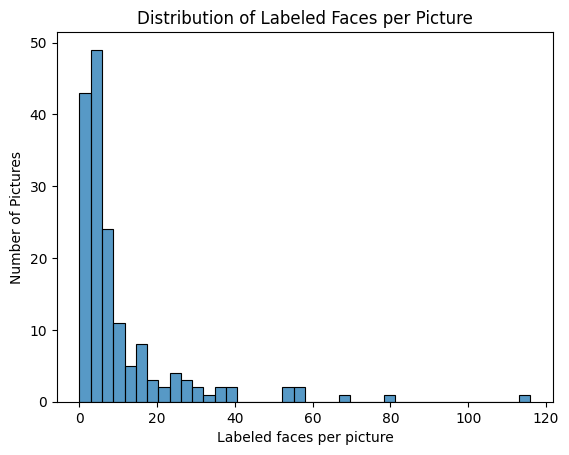

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

faces_per_picture = [len(data[i]['class_id']) for i in range(len(data))]
sns.histplot(faces_per_picture)
plt.xlabel('Labeled faces per picture')
plt.ylabel('Number of Pictures')
plt.title('Distribution of Labeled Faces per Picture')

#### 1.2.3. Count of all labeled expressions

The most common expression is `neutral` followed by `happy`. I tried to explicity select more pictures with less common expressions, such as `disgust`, but was not very successful.

C:\Users\ellis\AppData\Local\Temp\ipykernel_109952\3881838614.py:5: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  all_expressions_class_ids = pd.concat(all_pictures_class_ids, ignore_index=True)


Text(0.5, 1.0, 'Expression Count by Label')

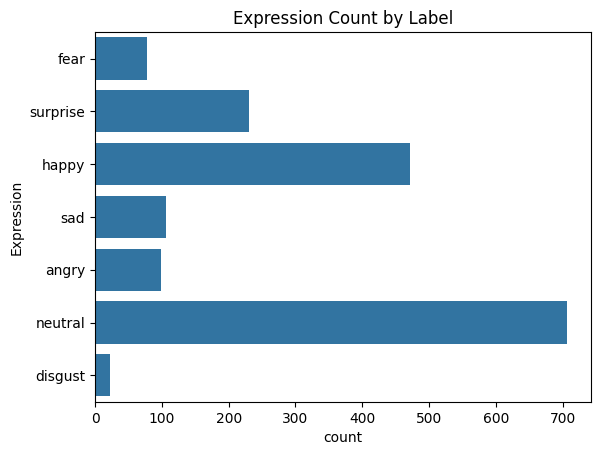

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

all_pictures_class_ids = [data[i]['class_id'] for i in range(len(data))]
all_expressions_class_ids = pd.concat(all_pictures_class_ids, ignore_index=True)

for i, cls in enumerate(classes):
    all_expressions_class_ids.replace(i, cls, inplace=True)

all_expressions_classes = all_expressions_class_ids

sns.countplot(all_expressions_classes)
plt.ylabel('Expression')
plt.title('Expression Count by Label')


### 1.3. Validation & Test sets

I simply split the validation and test sets by selecting random images. Given the imbalance in the data, it would be nice to stratify it, but I have no good way of doing so given that a single image can have multiple labels.

In [4]:
from sklearn.model_selection import train_test_split

data_val, data_test = train_test_split(data, test_size=0.33, random_state=42)

## 2. Test of face expression recognition models

### 2.1. Test on the FER-2013 test set
I test DeepFace, FER, and HSEmotion (High-Speed face Emotion recognition) on the FER-2013 test set. I decided to use this set to remove my own bias from the labeling. I found HSEmotion (github.com/av-savchenko/face-emotion-recognition) after running DeepFace and FER on the data and producing unsatisfactory results. As seen below, HSEmotion does much better and it's faster.

In [26]:
import cv2
import os
from collections import namedtuple

accuracy_data = namedtuple('accuracy_data', ['n_files', 'n_correct', 'accuracy'])

fer_2013_path ='fer-2013/test'

def expression_accuracy_fer_2013(emotion_detector: callable, path: str) -> dict:
    recognition_data = dict()
    emotions = os.listdir(path)
    for emotion in emotions:
        print('Testing ' + emotion)
        files = os.listdir(path + '/' + emotion)
        n_files = len(files)
        n_correct = 0
        for file in files:
            img = cv2.imread(path + '/' + emotion + '/' + file)
            detected_emotion = emotion_detector(img)
            if detected_emotion == emotion:
                n_correct += 1
        recognition_data[emotion] = accuracy_data(n_files, n_correct, n_correct/n_files)
    recognition_data['total_accuracy'] = total_accuracy_fer_2013(recognition_data)
    return recognition_data

def total_accuracy_fer_2013(recognition_data: dict) -> float:
    total_files = 0
    total_correct = 0
    for emotion_data in recognition_data.values():
        total_files += emotion_data.n_files
        total_correct += emotion_data.n_correct
    return total_correct/total_files

    

#### 2.1.1. DeepFace accuracy

In [15]:
from deepface import DeepFace

def deepface_er_wrapper(img) -> str:
    try:
        face_analysis = DeepFace.analyze(img, actions=['emotion'])
        return face_analysis[0]['dominant_emotion']
    except ValueError:
        return None

In [21]:
expression_accuracy_fer_2013(deepface_er_wrapper, fer_2013_path)

Testing angry
Testing disgust
Testing fear
Testing happy
Testing neutral
Testing sad
Testing surprise


{'angry': accuracy_data(n_files=958, n_correct=244, accuracy=0.2546972860125261),
 'disgust': accuracy_data(n_files=111, n_correct=21, accuracy=0.1891891891891892),
 'fear': accuracy_data(n_files=1024, n_correct=202, accuracy=0.197265625),
 'happy': accuracy_data(n_files=1774, n_correct=937, accuracy=0.528184892897407),
 'neutral': accuracy_data(n_files=1233, n_correct=491, accuracy=0.3982157339821573),
 'sad': accuracy_data(n_files=1247, n_correct=218, accuracy=0.1748195669607057),
 'surprise': accuracy_data(n_files=831, n_correct=350, accuracy=0.42117930204572807),
 'total_accuracy': 0.34313179158539986}

#### 2.1.2. FER accuracy (MTCNN classifier)

In [23]:
from fer import FER

emotion_detector_mtcnn = FER(mtcnn=True)

def fer_er_wrapper_mtcnn(img) -> str:
    dominant_emotion, emotion_score = emotion_detector_mtcnn.top_emotion(img)
    return dominant_emotion

In [28]:
expression_accuracy_fer_2013(fer_er_wrapper_mtcnn, fer_2013_path)

Testing angry
Testing disgust
Testing fear
Testing happy
Testing neutral
Testing sad
Testing surprise


{'angry': accuracy_data(n_files=958, n_correct=368, accuracy=0.38413361169102295),
 'disgust': accuracy_data(n_files=111, n_correct=2, accuracy=0.018018018018018018),
 'fear': accuracy_data(n_files=1024, n_correct=143, accuracy=0.1396484375),
 'happy': accuracy_data(n_files=1774, n_correct=1133, accuracy=0.6386696730552424),
 'neutral': accuracy_data(n_files=1233, n_correct=579, accuracy=0.46958637469586373),
 'sad': accuracy_data(n_files=1247, n_correct=284, accuracy=0.22774659182036888),
 'surprise': accuracy_data(n_files=831, n_correct=322, accuracy=0.38748495788206977),
 'total_accuracy': 0.39439955419336864}

#### 2.1.3. FER accuracy (Haar Cascade classifier)

This model just keeps returning `None` for the dominant emotion.

In [24]:
from fer import FER

emotion_detector_harr = FER(mtcnn=False)

def fer_er_wrapper_harr(img) -> str:
    dominant_emotion, emotion_score = emotion_detector_harr.top_emotion(img)
    return dominant_emotion

In [27]:
expression_accuracy_fer_2013(fer_er_wrapper_harr, fer_2013_path)

Testing angry
Testing disgust
Testing fear
Testing happy
Testing neutral
Testing sad
Testing surprise


{'angry': accuracy_data(n_files=958, n_correct=0, accuracy=0.0),
 'disgust': accuracy_data(n_files=111, n_correct=0, accuracy=0.0),
 'fear': accuracy_data(n_files=1024, n_correct=0, accuracy=0.0),
 'happy': accuracy_data(n_files=1774, n_correct=0, accuracy=0.0),
 'neutral': accuracy_data(n_files=1233, n_correct=0, accuracy=0.0),
 'sad': accuracy_data(n_files=1247, n_correct=0, accuracy=0.0),
 'surprise': accuracy_data(n_files=831, n_correct=0, accuracy=0.0),
 'total_accuracy': 0.0}

#### 2.1.4. HSEmotion accuracy (enet_b2_7 model)

Please note that HSEmotion latest (v0.2.1) requires timm==0.9.7

In [6]:
import torch
from hsemotion.facial_emotions import HSEmotionRecognizer

model_name='enet_b2_7'
device = 'cuda' if torch.cuda.is_available() else 'cpu'
fer=HSEmotionRecognizer(model_name=model_name,device=device)

emotion_map = {'Anger': 'angry', 'Fear': 'fear', 'Neutral': 'neutral', 'Sadness': 'sad',
               'Disgust': 'disgust', 'Surprise': 'surprise', 'Happiness': 'happy'}

def hsemotion_er_wrapper(img) -> str:
    emotion, scores=fer.predict_emotions(img,logits=True)
    return emotion_map[emotion]

expression_accuracy_fer_2013(hsemotion_er_wrapper, fer_2013_path)

C:\Users\ellis\.hsemotion\enet_b2_7.pt Compose(
    Resize(size=(260, 260), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)
Testing angry
Testing disgust
Testing fear
Testing happy
Testing neutral
Testing sad
Testing surprise


{'angry': accuracy_data(n_files=958, n_correct=536, accuracy=0.5594989561586639),
 'disgust': accuracy_data(n_files=111, n_correct=70, accuracy=0.6306306306306306),
 'fear': accuracy_data(n_files=1024, n_correct=340, accuracy=0.33203125),
 'happy': accuracy_data(n_files=1774, n_correct=1469, accuracy=0.8280721533258174),
 'neutral': accuracy_data(n_files=1233, n_correct=794, accuracy=0.6439578264395782),
 'sad': accuracy_data(n_files=1247, n_correct=415, accuracy=0.33279871692060947),
 'surprise': accuracy_data(n_files=831, n_correct=475, accuracy=0.5716004813477737),
 'total_accuracy': 0.5710504318751741}

#### 2.1.5. Conclusion of Testing on FER-2013
HSEmotion is better than DeepFace and FER at emotion detection on all metrics. As a bonus, it's also faster (perhaps because it's running on the GPU)!

### 2.2. Test on the FER+ test set
I test DeepFace, FER, and HSEmotion on the FER+ test set, which uses FER-2013 image with crowd-sourced labeling. Therefore, the labels should be of higher quality. A confounding factor with this data set is that it includes "contempt" as an emotion. HSEmotion supports a model that includes contempt, but I am not using it because I performed my own labeling of pictures provided for this project thinking that I would use DeepFace or FER, which don't support that expression. Therefore, if a picture is labeled with "contempt," I simply discard it.

Note that each picture is voted on by 10 labelers. I am aiming for obvious expressions, so I only use a picture if an expression label receives at least 6 votes.

Curiously, nothing correctly identifies any of the pictures labeled with `anger`. However, when I test HSEmotion on some other pictures in a later subsection, it successfully detects some angry expressions.

In [12]:
import pandas as pd

fer_plus_path = 'fer_plus/FER2013Test'
header = ['file_name', 'dimensions', 'neutral', 'happy', 'surprise', 'sad', 'anger', 'disgust', 'fear', 'contempt', 'unknown', 'No Face']
labels = pd.read_csv(fer_plus_path + '/label.csv', names=header)
labels

,file_name,dimensions,neutral,happy,surprise,sad,anger,disgust,fear,contempt,unknown,No Face
0,fer0032220.png,"(0, 0, 48, 48)",0,0,0,0,2,1,0,7,0,0
1,fer0032222.png,"(0, 0, 48, 48)",3,0,0,5,0,0,0,0,2,0
2,fer0032223.png,"(0, 0, 48, 48)",6,0,1,2,0,0,0,0,1,0
3,fer0032224.png,"(0, 0, 48, 48)",0,0,4,0,1,2,3,0,0,0
4,fer0032225.png,"(0, 0, 48, 48)",0,0,0,0,9,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3568,fer0035796.png,"(0, 0, 48, 48)",5,0,0,3,0,0,0,0,2,0
3569,fer0035797.png,"(0, 0, 48, 48)",8,0,0,2,0,0,0,0,0,0
3570,fer0035799.png,"(0, 0, 48, 48)",0,0,0,0,7,1,0,2,0,0
3571,fer0035800.png,"(0, 0, 48, 48)",0,10,0,0,0,0,0,0,0,0


In [13]:
import cv2

emotions = ['neutral', 'happy', 'surprise', 'sad', 'anger', 'disgust', 'fear']

def expression_accuracy_fer_plus(emotion_detector: callable, path: str) -> dict:
    recognition_data = {emotion: {'n_files': 0, 'n_correct': 0} for emotion in emotions}
    for i, file in enumerate(labels['file_name']):
        if (emotion_label := get_emotion_label(labels.iloc[i, 2:9], min_votes=6)):
            recognition_data[emotion_label]['n_files'] += 1
            img = cv2.imread(path + '/' + file)
            if emotion_label == emotion_detector(img):
                recognition_data[emotion_label]['n_correct'] += 1

    accuracy_fer_plus(recognition_data)
    return recognition_data

def get_emotion_label(votes: pd.Series, min_votes) -> str:
    if votes.max() >= min_votes:
        return votes.idxmax()
    return None

def accuracy_fer_plus(recognition_data: dict) -> None:
    total_files = 0
    total_correct = 0
    for emotion_data in recognition_data.values():
        n_files = emotion_data['n_files']
        n_correct = emotion_data['n_correct']
        total_files += n_files
        total_correct += n_correct
        emotion_data['accuracy'] = n_correct/n_files
    recognition_data['total_accuracy'] = total_correct/total_files
    return

#### 2.2.1. DeepFace accuracy

In [18]:
expression_accuracy_fer_plus(deepface_er_wrapper, fer_plus_path)

{'neutral': {'n_files': 931,
  'n_correct': 324,
  'accuracy': 0.34801288936627284},
 'happy': {'n_files': 874, 'n_correct': 460, 'accuracy': 0.5263157894736842},
 'surprise': {'n_files': 344,
  'n_correct': 157,
  'accuracy': 0.4563953488372093},
 'sad': {'n_files': 297, 'n_correct': 53, 'accuracy': 0.17845117845117844},
 'anger': {'n_files': 211, 'n_correct': 0, 'accuracy': 0.0},
 'disgust': {'n_files': 9, 'n_correct': 3, 'accuracy': 0.3333333333333333},
 'fear': {'n_files': 50, 'n_correct': 15, 'accuracy': 0.3},
 'total_accuracy': 0.37260677466863035}

#### 2.2.2. FER accuracy (MTCNN classifier)

In [25]:
expression_accuracy_fer_plus(fer_er_wrapper_mtcnn, fer_plus_path)

{'neutral': {'n_files': 931, 'n_correct': 418, 'accuracy': 0.4489795918367347},
 'happy': {'n_files': 874, 'n_correct': 573, 'accuracy': 0.6556064073226545},
 'surprise': {'n_files': 344,
  'n_correct': 136,
  'accuracy': 0.3953488372093023},
 'sad': {'n_files': 297, 'n_correct': 79, 'accuracy': 0.265993265993266},
 'anger': {'n_files': 211, 'n_correct': 0, 'accuracy': 0.0},
 'disgust': {'n_files': 9, 'n_correct': 0, 'accuracy': 0.0},
 'fear': {'n_files': 50, 'n_correct': 9, 'accuracy': 0.18},
 'total_accuracy': 0.4473490427098675}

#### 2.2.3. FER accuracy (Haar Cascade classifier)

I didn't bother running this model since it just keeps returning `None` for the dominant emotion.

#### 2.2.4. HSEmotion accuracy (enet_b2_7 model)

Please note that HSEmotion latest (v0.2.1) requires timm==0.9.7

In [19]:
expression_accuracy_fer_plus(hsemotion_er_wrapper, fer_plus_path)

{'neutral': {'n_files': 931, 'n_correct': 570, 'accuracy': 0.6122448979591837},
 'happy': {'n_files': 874, 'n_correct': 743, 'accuracy': 0.8501144164759725},
 'surprise': {'n_files': 344,
  'n_correct': 198,
  'accuracy': 0.5755813953488372},
 'sad': {'n_files': 297, 'n_correct': 178, 'accuracy': 0.5993265993265994},
 'anger': {'n_files': 211, 'n_correct': 0, 'accuracy': 0.0},
 'disgust': {'n_files': 9, 'n_correct': 5, 'accuracy': 0.5555555555555556},
 'fear': {'n_files': 50, 'n_correct': 49, 'accuracy': 0.98},
 'total_accuracy': 0.6417525773195877}

#### 2.2.5. Conclusion of Testing on FER+
HSEmotion is the best model on all fronts except for detecting anger, which none of the models detected any of the images for. It's possible that a model that is trained with all eight emotions would do better at detecting anger on this dataset, but I do not explore that possibility here.

### 2.3. Overall testing conclusion
Since HSEmotion produces more accurate and faster results than the other models, it is clearly the best option moving forward, and I will use it in my modeling pipeline.

### 2.4 Emotion detection on some cropped faces from the provided dataset
I cropped some expressions from the dataset whose labels I thought were obvious. The heading for the subsection is the label I assigned, while image title is the prediction.

Clearly the expression detection still has some issues. Complicating the situation, my labeling is unlikely to be perfect.

In [32]:
import cv2
import os
import matplotlib.pyplot as plt

def hsemotion_test_directory(path: str) -> dict:
    files = os.listdir(path)
    expressions = dict()
    for file in files:
        expressions[file] = dict()
        img_bgr = cv2.imread(path + '/' + file)
        img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        expressions[file]['img'] = img
        expressions[file]['prediction'] = hsemotion_er_wrapper(img)
    return expressions

def plot_expressions(expressions: dict) -> None:
    nplots = len(expressions)
    plt.figure(figsize=(5, 5 * nplots))
    for i, expression in enumerate(expressions.values()):
        plt.subplot(1, nplots, i+1)
        plt.axis('off')
        plt.imshow(expression['img'])
        plt.title(expression['prediction'])
    return

#### 2.4.1. Angry

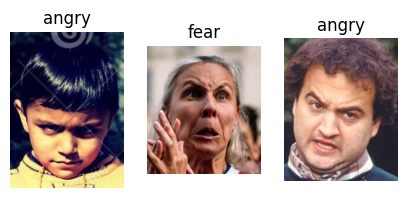

In [33]:
expressions = hsemotion_test_directory('Obvious expressions/angry')
plot_expressions(expressions)

#### 2.4.2. Disgust

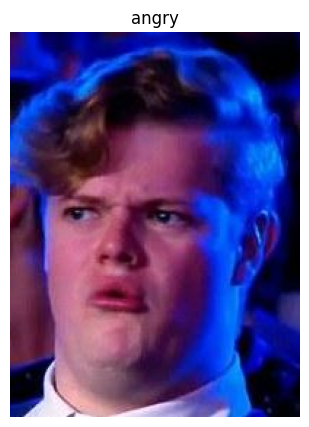

In [34]:
expressions = hsemotion_test_directory('Obvious expressions/disgust')
plot_expressions(expressions)

#### 2.4.3. Fear

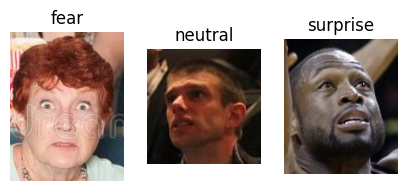

In [35]:
expressions = hsemotion_test_directory('Obvious expressions/fear')
plot_expressions(expressions)

#### 2.4.4. Happy

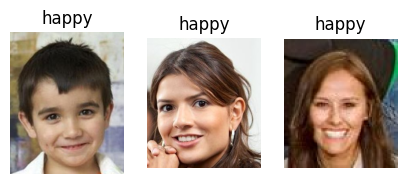

In [36]:
expressions = hsemotion_test_directory('Obvious expressions/happy')
plot_expressions(expressions)

#### 2.4.5. Neutral

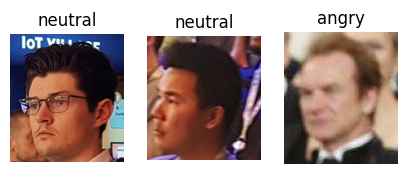

In [37]:
expressions = hsemotion_test_directory('Obvious expressions/neutral')
plot_expressions(expressions)

#### 2.4.6. Sad

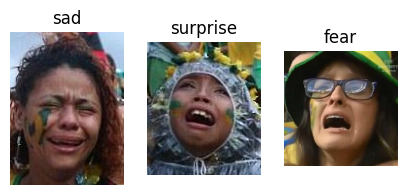

In [38]:
expressions = hsemotion_test_directory('Obvious expressions/sad')
plot_expressions(expressions)

#### 2.4.7. Surprise

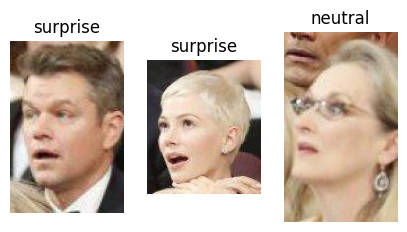

In [39]:
expressions = hsemotion_test_directory('Obvious expressions/surprise')
plot_expressions(expressions)

## 3. Test of face super-resolution

There are some packages on PyPI that support super-resolution out-of-the-box. I try torchsr below, but it doesn't work well faces. Therefore, I wanted one that would be fast and was designed for faces. I wanted to try the model ELSFace from the paper `An Efficient Latent Style Guided Transformer-CNN Framework for Face Super-Resolution`, published in 2023, but ran into errors in testing. After fixing the first error and running into another, I decided that I didn't have time to get it working. I also tried SCGAN from the paper `Semi-Cycled Generative Adversarial Networks for Real-World Face Super-Resolution`, also published in 2023, but in some ways, it seemed to work worse than torchsr.

### 3.1. Test of torchsr on a down-scaled image
Torchsr does not work well on down-scaled faces. The original image is down-scaled to 16x16 pixels, then up-scaled with torchsr to 64x64 pixels. The up-scaled image looks distorted compared to the original image and not much better than the downscaled image. While this test was performed with the EDSR model, RCAN and NinaSR-B2 produce similar results.

Text(0.5, 1.0, 'Super-resolution')

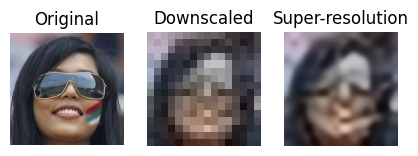

In [89]:
import cv2
from torchsr.models import edsr_r32f256
from torchvision.transforms.functional import to_pil_image, to_tensor



def plot_expressions(expressions: dict) -> None:
    nplots = len(expressions)
    plt.figure(figsize=(5, 5 * nplots))
    for i, expression in enumerate(expressions.values()):
        plt.subplot(1, nplots, i+1)
        plt.axis('off')
        plt.imshow(expression['img'])
        plt.title(expression['prediction'])
    return

img_orig_bgr = cv2.imread('blurry/img1-hi-res.jpg')
img_orig = cv2.cvtColor(img_orig_bgr, cv2.COLOR_BGR2RGB)
img_downscaled_bgr = cv2.imread('blurry/img1-lo-res-16.jpg')
img_downscaled = cv2.cvtColor(img_downscaled_bgr, cv2.COLOR_BGR2RGB)

model = edsr_r32f256(scale=4, pretrained=True)
lr_t = to_tensor(img_downscaled).unsqueeze(0)
sr_t = model(lr_t)
img_sr = to_pil_image(sr_t.squeeze(0))

plt.figure(figsize=(5, 5 * 3))
plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(img_orig)
plt.title('Original')

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(img_downscaled)
plt.title('Downscaled')

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(img_sr)
plt.title('Super-resolution')

### 3.2. Test of SCGAN on a down-scaled image
I downloaded SCGAN from github.com/HaoHou-98/SCGAN and got it working by copying a lot of code out of the test.py file. Again, the image is scaled down to 16x16 pixels, which is the model's required input size. While the face shape is better than in torchsr, the blue skin tone is an interesting anomaly. The sunglasses also appear to give it particular trouble. This result implies that, while the model might do well on the academic dataset it was trained and tested on, real-world images may give it more trouble. More testing would be required to determine how well the model performs on real-world images.

Text(0.5, 1.0, 'Super-resolution')

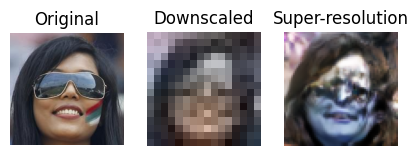

In [55]:
from torchvision import transforms
import torch
import PIL
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

from SCGAN.model import G_RLS

imgpath = fpath='blurry/img1-lo-res-16.jpg'

transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

data = {}
inp16 = Image.open(imgpath)
inp64 = inp16.resize((64, 64), resample=PIL.Image.BICUBIC)
data['img64'] = transform(inp64).unsqueeze(0)
data['img16'] = transform(inp16).unsqueeze(0)
data['imgpath'] = imgpath
data["z"] = torch.randn(1, 1, 64, dtype=torch.float32)

net_G_RLS = G_RLS()
net_G_RLS = net_G_RLS.cuda()
a = torch.load('./SCGAN/pretrained_model/pretrained_model.pth')["G_l2h"]
net_G_RLS.load_state_dict(a)
net_G_RLS = net_G_RLS.eval()

low_temp = data["img16"].numpy()
low = torch.from_numpy(np.ascontiguousarray(low_temp[:, ::-1, :, :])).cuda()
with torch.no_grad():
    test_sr = net_G_RLS(low)
test_sr = test_sr.detach().cpu().numpy().transpose(0, 2, 3, 1).squeeze(0)
test_sr = (test_sr - test_sr.min()) / (test_sr.max() - test_sr.min())
test_sr = (test_sr * 255).astype(np.uint8)

img_orig_bgr = cv2.imread('blurry/img1-hi-res.jpg')
img_orig = cv2.cvtColor(img_orig_bgr, cv2.COLOR_BGR2RGB)
img_downscaled_bgr = cv2.imread(imgpath)
img_downscaled = cv2.cvtColor(img_downscaled_bgr, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(5, 5 * 3))
plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(img_orig)
plt.title('Original')

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(img_downscaled)
plt.title('Downscaled')

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(test_sr)
plt.title('Super-resolution')

### 3.3. Face super-resolution conclusion
Since torchsr and SCGAN produced unsatisfactory results, I am placing super-resolution to the side and moving on. It is disappointing that I did not have time to get ELSFace working, as the results from the paper implied that it works better than SCGAN, and may have been usable.

## 4. Minimum face resolution

Even with super-resolution, I would have needed to set a lower bound on resolution that I could use for face recognition. It simply would have been lower with super-resolution than without. Therefore, I test HSEmotion on a few faces at different resolutions.

In [85]:
import torch
from hsemotion.facial_emotions import HSEmotionRecognizer
import cv2
import numpy as np

model_name='enet_b2_7'
device = 'cuda' if torch.cuda.is_available() else 'cpu'
fer=HSEmotionRecognizer(model_name=model_name, device=device)

def test_hsemotion_vs_resolution(img_i: int) -> None:
    path = 'blurry'
    suffixes = ['-hi-res.jpg', '-lo-res-50.jpg', '-lo-res-35.jpg', '-lo-res-25.jpg', '-lo-res-16.jpg']
    
    img_results = []
    for suffix in suffixes:
        fpath = path + '/img' + str(img_i) + suffix
        img = load_img(fpath)
        emotion, score = fer.predict_emotions(img, logits=True)
        img_result = {'img': img, 'prediction': emotion}
        img_results.append(img_result)
    plot_images(img_results)

def load_img(fpath: str) -> np.ndarray:
    img_bgr = cv2.imread(fpath)
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

def plot_images(img_results: list) -> None:
    nplots = len(img_results)
    plt.figure(figsize=(10, 10 * nplots))
    for i, result in enumerate(img_results):
        resolution = result['img'].shape[0]
        plt.subplot(1, nplots, i+1)
        plt.axis('off')
        plt.imshow(result['img'])
        plt.title(str(resolution) + 'px: ' + result['prediction'])
    plt.tight_layout()
    return

C:\Users\ellis\.hsemotion\enet_b2_7.pt Compose(
    Resize(size=(260, 260), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


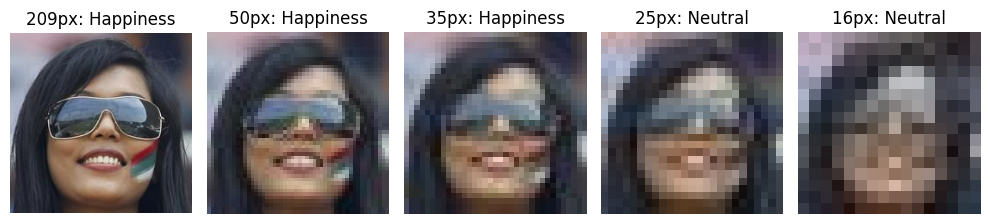

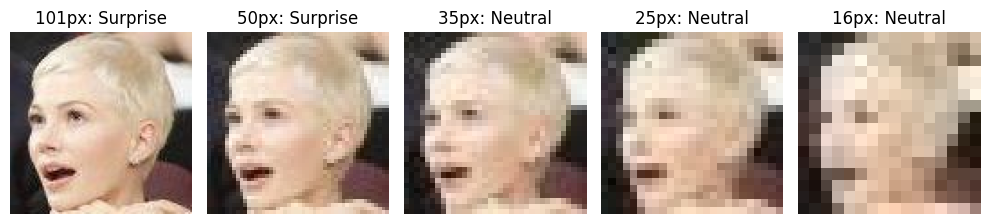

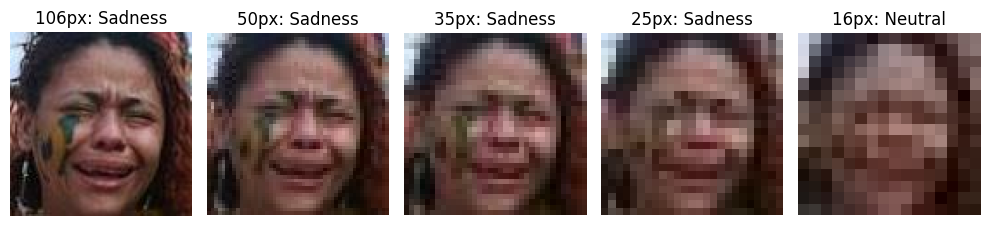

In [86]:
test_hsemotion_vs_resolution(1)
test_hsemotion_vs_resolution(2)
test_hsemotion_vs_resolution(3)

Based on this test, about 35px appears to be the lower bound I should use for a face size. That is in the largest dimension, as faces are not square. It is also just a rough guideline, as this reolution can also be used as a hyperparameter. The model may work better at this resolution than it does in this test because face detection algorithms tend to set the bounding box so that it hugs the face more than my cropping does in these pictures.

## 5. Face detection

In this section, I examine several face detection models. I test for speed, perform a simple visual examination of face detection performance on a complex picture, and plot a histogram of intersection over union (IoU) for my entire validation dataset. At the end, I compare the model performance using IoU histograms. 

Note that, for the IoU, my method keeps the false negatives and drops the false positives, so IoU=0 means that I labeled a face that wasn't detected by the model. If I have time, I might also look at keeping the false positives and dropping the false negatives.

In [7]:
# Basic shared information used below
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
img_path = 'Scraped-Dataset for GroupEmotion/0bdf746fee424ed3b299b427bcb6efdc.jpg'

### 5.0. Intersection over Union (IoU) false positives and false negatives

#### 5.0.1. Explanation and illustration of false positives and false negatives

The IoU metric is required to determine if a model has correctly detected a face. However, complications arise in determining exactly when we have a false positive or a false negative. In the image below, ground truth boxes are red and predicted boxes are blue. The first image below illustrates two kinds of false negatives. In the upper left picture of the image, the ground truth box stands alone. In the center picture in the second row of the image, there are two ground truth boxes that slightly overlap with prediction boxes. Similarly, we see the two types of false positives in the second image below, where a some predicted boxes stand alone and where others slightly overlap with ground truth boxes, and nothing else.


0: 960x736 20 faces, 18.0ms
Speed: 4.5ms preprocess, 18.0ms inference, 2.5ms postprocess per image at shape (1, 3, 960, 736)

0: 704x960 35 faces, 17.1ms
Speed: 4.0ms preprocess, 17.1ms inference, 4.0ms postprocess per image at shape (1, 3, 704, 960)


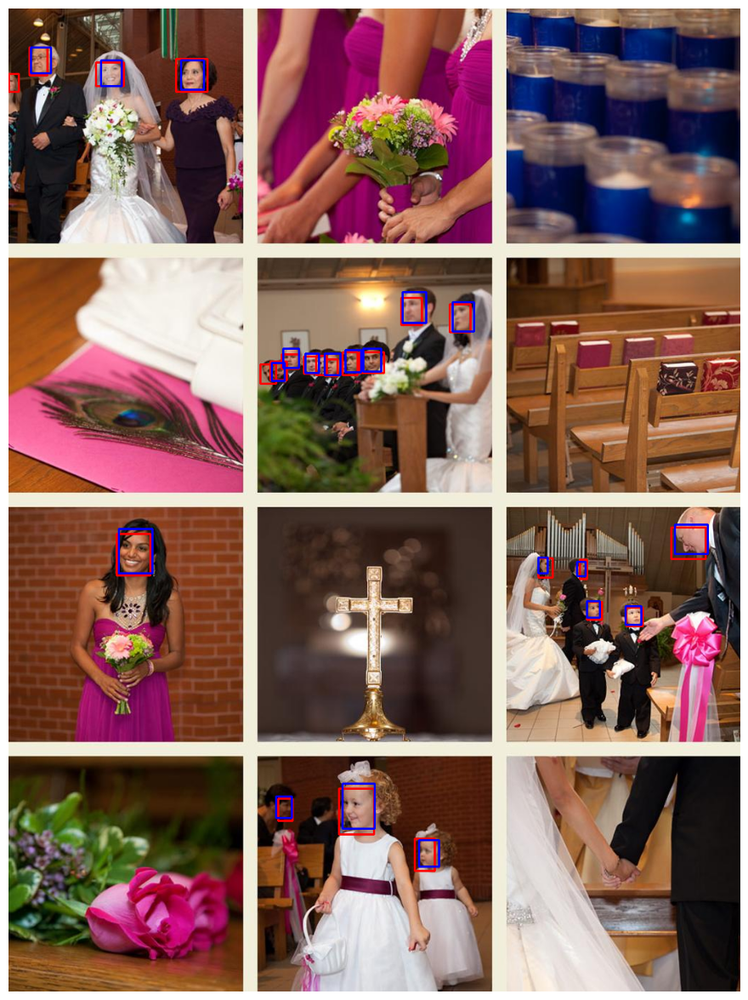

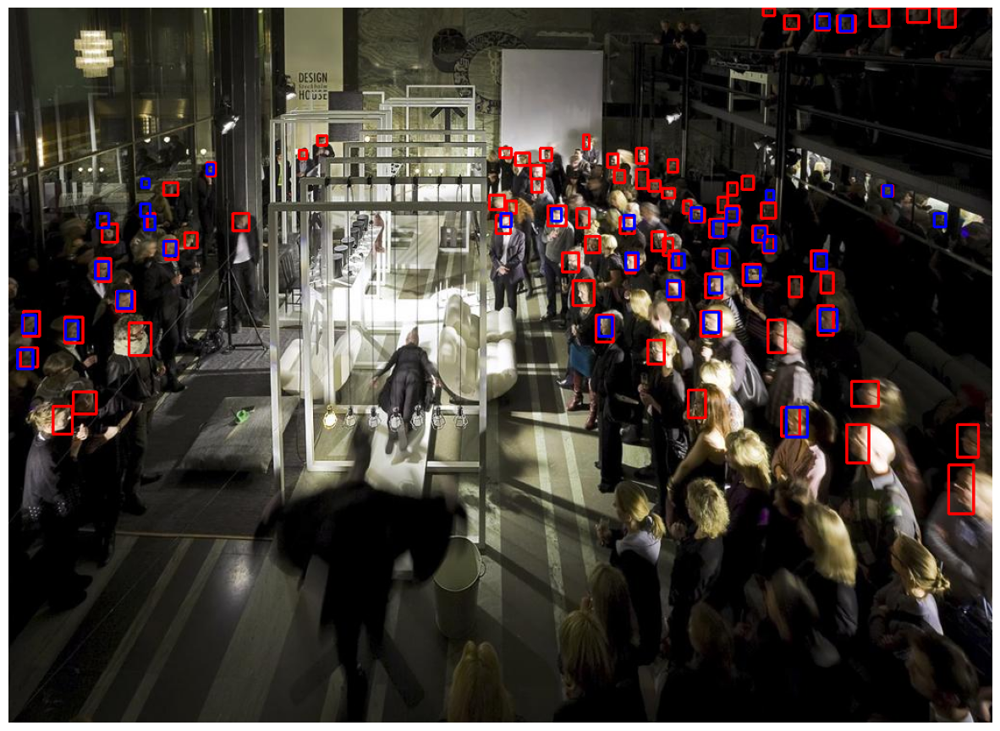

In [12]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

model = YOLO('yolov8-face/yolov8l-face.pt')
model.to(device)

def plot_bboxes(img_i: int):
    img = data_val[img_i]['img'].copy()
    label_boxes = data_val[img_i]['xyxy']


    results = model(img)

    # ground truth boxes
    for bbox in label_boxes:
        box = bbox.cpu().numpy().astype(int)
        x1,y1,x2,y2=box[0:4]
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

    # predicted boxes
    for bbox in results[0].boxes.xyxy:
        box = bbox.cpu().numpy().astype(int)
        x1,y1,x2,y2=box[0:4]
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
        
    plt.figure(figsize=(15,15))
    plt.axis('off')
    plt.imshow(img)
    
plot_bboxes(29)
plot_bboxes(38)

#### 5.0.2. Calculating false positives and false negatives

The calculation of false positives and false negatives is quite simple. The function to calculate IoUs produces a 2D array, which is the IoU of every ground truth box (rows) with every prediction box (columns). We simply set a threshold (I use 0.3 since my bounding ground truth bounding boxes aren't very tight), and when taking the max along a row, if the result is less than that threshold, we have false negative. Similarly, if the result is less than the threshold when taking a max along a column, we have a false positive. Afterwards, the number of predicted boxes minus the false positives should equal the number of ground truth boxes minus the false negatives. If not, a more complicated algorithm is required, which I also implement below and only call if the first algorithm doesn't work since it's less efficient.

In [25]:
import torchvision

# for calculating and plotting the nummber of false positives, false negatives, and true positives.
def iou_plot_fp_fn_tp(gt_data: dict, all_pred_bboxes: list[torch.tensor], threshold: float, model_title: str):
    """
    For calculating and plotting the nummber of false positives, false negatives, and
    true positives based on the IoU metric.
    """
    false_positives = 0
    false_negatives = 0
    true_positives = 0
    for img_data, img_pred_bboxes in zip(gt_data, all_pred_bboxes):
        gt_bboxes = img_data['xyxy']
        if gt_bboxes.nelement() == 0 and img_pred_bboxes.nelement() != 0:
            false_positives += img_pred_bboxes.shape[0]
        elif gt_bboxes.nelement() != 0 and img_pred_bboxes.nelement() == 0:
            false_negatives += gt_bboxes.shape[0]
        elif gt_bboxes.nelement() != 0 and img_pred_bboxes.nelement() != 0:
            iou = torchvision.ops.box_iou(gt_bboxes, img_pred_bboxes)
            iou_maxes_pred, _ = iou.max(dim=0)
            img_false_positives = sum(iou_maxes_pred < threshold)
            iou_maxes_gt, _ = iou.max(dim=1)
            img_false_negatives = sum(iou_maxes_gt < threshold)
            img_true_positives = iou.shape[1] - img_false_positives
            if img_true_positives != iou.shape[0] - img_false_negatives:
                img_false_positives, img_false_negatives, img_true_positives = complex_iou_fp_fn_tp(iou, threshold)
            false_positives += img_false_positives
            false_negatives += img_false_negatives
            true_positives += img_true_positives
            
    plot_x_labels = ['false positives', 'false negatives', 'true positives']
    counts = [false_positives, false_negatives, true_positives]
    plt.figure(figsize=(7,7))
    plt.bar(plot_x_labels, counts)
    plt.ylabel('Counts')
    plt.title(f'{model_title} detections based on IoU')    
    
    classifications = {'fp': false_positives, 'fn': false_negatives, 'tp': true_positives}
    return classifications

def complex_iou_fp_fn_tp(iou: torch.tensor, threshold: float) -> tuple[int, int, int]:
    """
    A more complex and less efficient way of calculating the nummber of false positives,
    false negatives, and true positives based on the IoU metric.
    """
    false_positives = 0
    false_negatives = 0
    gt_true_positives = 0
    pred_true_positives = 0
    for r in range(iou.shape[0]):
        if iou[r,:].max() <= threshold or iou[:,iou[r,:].argmax()].argmax() != r:
            false_negatives += 1
        else:
            gt_true_positives += 1
            
    for c in range(iou.shape[1]):
        if iou[:,c].max() <= threshold or iou[iou[:,c].argmax(),:].argmax() != c:
            false_positives += 1
        else:
            pred_true_positives += 1
            
    assert gt_true_positives == pred_true_positives
    return false_positives, false_negatives, gt_true_positives

### 5.1. YOLOv8-face

Supposed to be fast and accurate. There are actually three trained models avaialable, `n` (nano), `m` (medium), and `l` (large), in order of increasing parameters. Found at github.com/akanametov/yolo-face.

#### 5.1.1. Runtime

I'm running on my GPU (RTX 4070Ti), and the large model is plenty fast. To run on something like a mobile device, we might try something smaller. However, that would also come with an accuracy tradeoff, as seen below in the test image.

In [76]:
from ultralytics import YOLO
import timeit

n_iter = 100

model = YOLO('yolov8-face/yolov8n-face.pt')
model.to('cuda')
runtime_n_gpu = timeit.timeit(lambda: model(img_path), number=n_iter)
model.to('cpu')
runtime_n_cpu = timeit.timeit(lambda: model(img_path), number=n_iter)

model = YOLO('yolov8-face/yolov8m-face.pt')
model.to('cuda')
runtime_m_gpu = timeit.timeit(lambda: model(img_path), number=n_iter)
model.to('cpu')
runtime_m_cpu = timeit.timeit(lambda: model(img_path), number=n_iter)

model = YOLO('yolov8-face/yolov8l-face.pt')
model.to('cuda')
runtime_l_gpu = timeit.timeit(lambda: model(img_path), number=n_iter)
model.to('cpu')
runtime_l_cpu = timeit.timeit(lambda: model(img_path), number=n_iter)

print(f'Nano model runtime on GPU: {runtime_n_gpu/n_iter:.3f}s per iteration')
print(f'Nano model runtime on CPU: {runtime_n_cpu/n_iter:.3f}s per iteration')
print(f'Medium model runtime on GPU: {runtime_m_gpu/n_iter:.3f}s per iteration')
print(f'Medium model runtime on CPU: {runtime_m_cpu/n_iter:.3f}s per iteration')
print(f'Large model runtime on GPU: {runtime_l_gpu/n_iter:.3f}s per iteration')
print(f'Large model runtime on CPU: {runtime_l_cpu/n_iter:.3f}s per iteration')



image 1/1 g:\My Drive\Coding_interviews\Interview Kickstart ML\DL Mini Project\Scraped-Dataset for GroupEmotion\0bdf746fee424ed3b299b427bcb6efdc.jpg: 480x640 94 faces, 27.0ms
Speed: 6.0ms preprocess, 27.0ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 g:\My Drive\Coding_interviews\Interview Kickstart ML\DL Mini Project\Scraped-Dataset for GroupEmotion\0bdf746fee424ed3b299b427bcb6efdc.jpg: 480x640 94 faces, 22.0ms
Speed: 4.0ms preprocess, 22.0ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 g:\My Drive\Coding_interviews\Interview Kickstart ML\DL Mini Project\Scraped-Dataset for GroupEmotion\0bdf746fee424ed3b299b427bcb6efdc.jpg: 480x640 94 faces, 23.0ms
Speed: 3.0ms preprocess, 23.0ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 g:\My Drive\Coding_interviews\Interview Kickstart ML\DL Mini Project\Scraped-Dataset for GroupEmotion\0bdf746fee424ed3b299b427bcb6efdc.jpg: 480x640 94 faces, 17.0ms
Speed

#### 5.1.2. Visual test on a single image

As we can see in the images below, the nano model misses many faces. The medium model picks up on most of the faces missed by the nano model. The large model picks up on a couple more faces, and drops at least 2 duplicate bounding boxes. All the models are picking up blurry faces, which may be an issue moving forward.


image 1/1 g:\My Drive\Coding_interviews\Interview Kickstart ML\DL Mini Project\Scraped-Dataset for GroupEmotion\0bdf746fee424ed3b299b427bcb6efdc.jpg: 480x640 94 faces, 102.7ms
Speed: 4.0ms preprocess, 102.7ms inference, 71.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 g:\My Drive\Coding_interviews\Interview Kickstart ML\DL Mini Project\Scraped-Dataset for GroupEmotion\0bdf746fee424ed3b299b427bcb6efdc.jpg: 704x960 120 faces, 106.3ms
Speed: 4.5ms preprocess, 106.3ms inference, 2.0ms postprocess per image at shape (1, 3, 704, 960)

image 1/1 g:\My Drive\Coding_interviews\Interview Kickstart ML\DL Mini Project\Scraped-Dataset for GroupEmotion\0bdf746fee424ed3b299b427bcb6efdc.jpg: 704x960 121 faces, 95.4ms
Speed: 4.5ms preprocess, 95.4ms inference, 2.5ms postprocess per image at shape (1, 3, 704, 960)


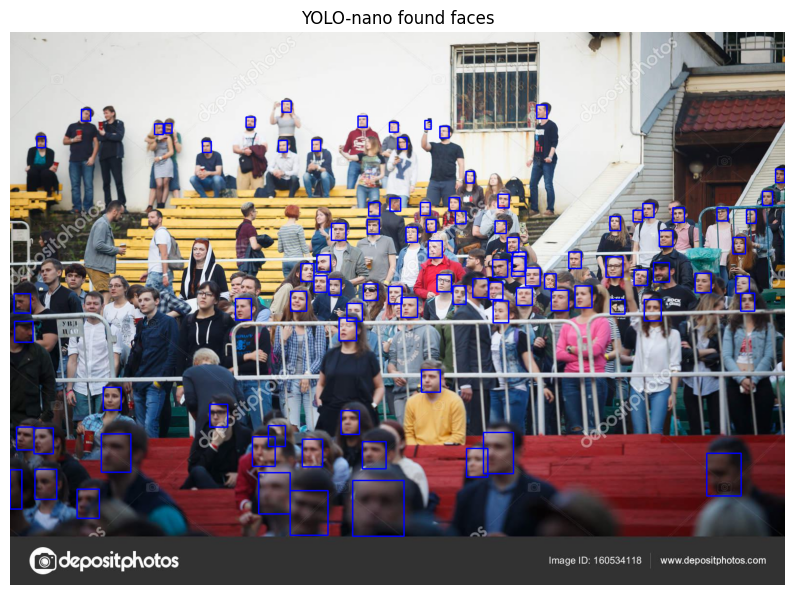

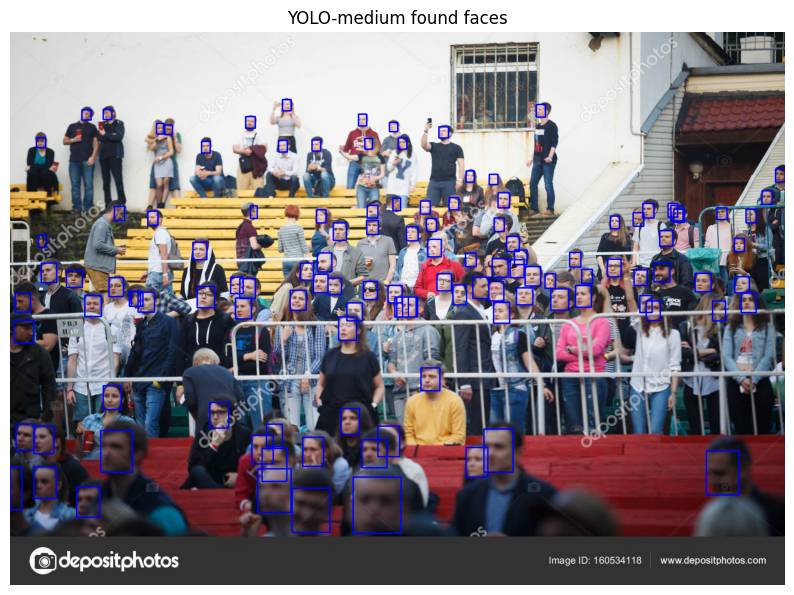

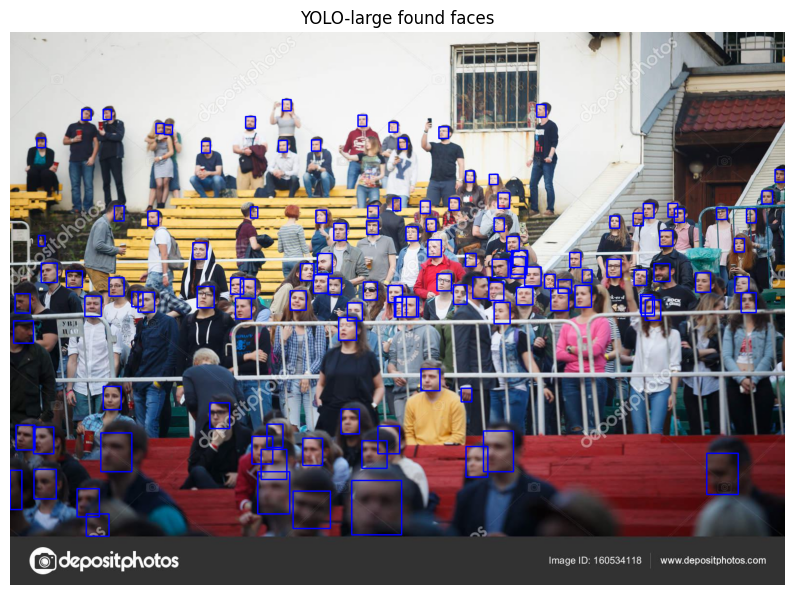

In [8]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

def yolo_plot(model_path: str, img_path: str, img_title: str):
    model = YOLO(model_path)
    model.to(device)
    results = model(img_path)

    img_bgr = cv2.imread(img_path)
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    for bbox in results[0].boxes.xyxy:
        box = bbox.cpu().numpy().astype(int)
        x1,y1,x2,y2=box[0:4]
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
        
    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.imshow(img)
    plt.title(img_title)
    return


yolo_plot('yolov8-face/yolov8n-face.pt', img_path, 'YOLO-nano found faces')
yolo_plot('yolov8-face/yolov8m-face.pt', img_path, 'YOLO-medium found faces')
yolo_plot('yolov8-face/yolov8l-face.pt', img_path, 'YOLO-large found faces')

#### 5.1.3 Intersection over union (IoU) on validation set

As seen in the plots below, the smallest model is missing a lot of faces, and we can see that the large model has less false positives than the medium model, while both have about the same number false negatives and true positives. Therefore, the large model performs best.


0: 448x640 (no detections), 19.1ms
Speed: 2.0ms preprocess, 19.1ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 10 faces, 18.5ms
Speed: 4.5ms preprocess, 18.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 640x448 9 faces, 15.7ms
Speed: 2.0ms preprocess, 15.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 448)

0: 480x640 10 faces, 15.3ms
Speed: 2.0ms preprocess, 15.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 17 faces, 16.6ms
Speed: 3.0ms preprocess, 16.6ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 4 faces, 23.0ms
Speed: 4.5ms preprocess, 23.0ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 faces, 16.6ms
Speed: 2.0ms preprocess, 16.6ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)

0: 608x640 4 faces, 18.0ms
Speed: 3.5ms preprocess, 18.0ms inference, 2.0ms postprocess per image at shape (1, 3,

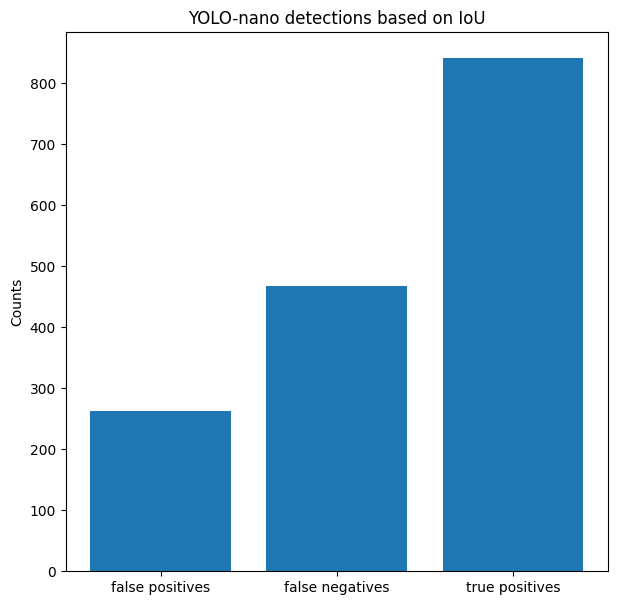

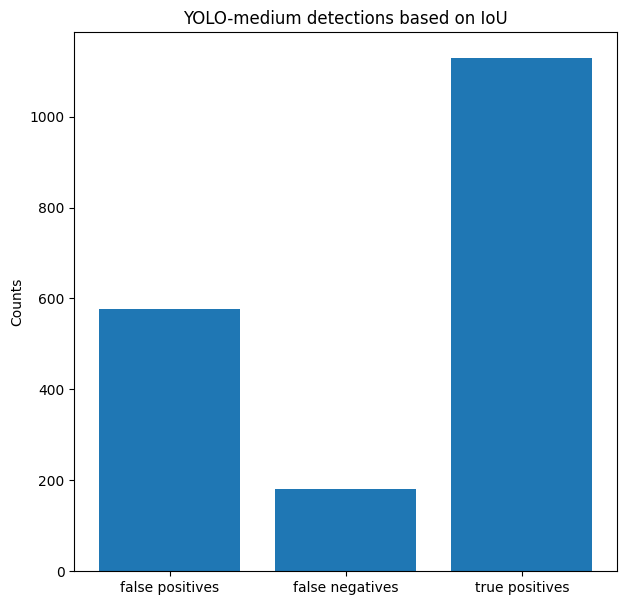

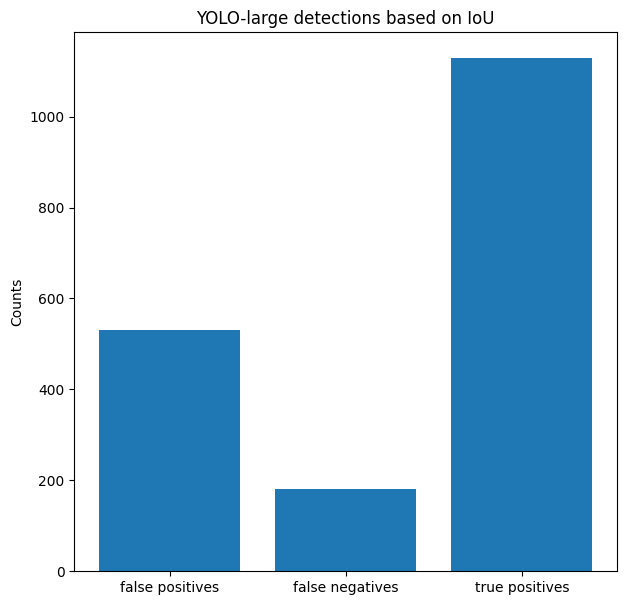

In [26]:
from ultralytics import YOLO

def yolo_bboxes(model: YOLO, gt_data: dict):
    all_pred_bboxes = []
    for img_data in gt_data:
        img = img_data['img']
        results = model(img)
        all_pred_bboxes.append(results[0].boxes.xyxy.cpu())
    return all_pred_bboxes

def iou_yolo_categorization_plot(model_path: str, model_name: str, gt_data: dict):
    model = YOLO(model_path)
    model.to(device)
    all_pred_bboxes = yolo_bboxes(model, gt_data)
    return iou_plot_fp_fn_tp(gt_data, all_pred_bboxes, 0.3, model_name)
    

yolon_iou_classifications = iou_yolo_categorization_plot('yolov8-face/yolov8n-face.pt', 'YOLO-nano', data_val)
yolom_iou_classifications = iou_yolo_categorization_plot('yolov8-face/yolov8m-face.pt', 'YOLO-medium', data_val)
yolol_iou_classifications = iou_yolo_categorization_plot('yolov8-face/yolov8l-face.pt', 'YOLO-large', data_val)

### 5.2. Facenet-pytorch (MTCNN)
An older model from several years ago. Comes with the small advantage of not having to download models manually off of GitHub. Appears to be slower and less accurate than the medium and large YOLOv8 model.

#### 5.2.1 Runtime

I only ran this model on the GPU. It is an order of magnitude slower than the largest YOLO model on the GPU. Furthermore, it's not much slower on the CPU, so it's not taking good advantage of the GPU.

In [14]:
from facenet_pytorch import MTCNN
import cv2
import timeit

n_iter = 100

img_bgr = cv2.imread(img_path)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

mtcnn = MTCNN(keep_all=False, post_process=False, device='cuda')
runtime_gpu = timeit.timeit(lambda: mtcnn.detect(img, landmarks=False), number=n_iter)

mtcnn = MTCNN(keep_all=False, post_process=False, device='cpu')
runtime_cpu = timeit.timeit(lambda: mtcnn.detect(img, landmarks=False), number=n_iter)

print(f'Model runtime on GPU: {runtime_gpu/n_iter:.3f}s per iteration')
print(f'Model runtime on CPU: {runtime_cpu/n_iter:.3f}s per iteration')

Model runtime on GPU: 0.632s per iteration
Model runtime on CPU: 1.264s per iteration


#### 5.2.2. Visual test on a single image

As we can see in the image, MTCNN found almost all the faces. It found also found a cup in somebody's hand and the back of somebody's head, but that's fixable by filtering on probabilities.

Text(0.5, 1.0, 'Facenet-pytorch')

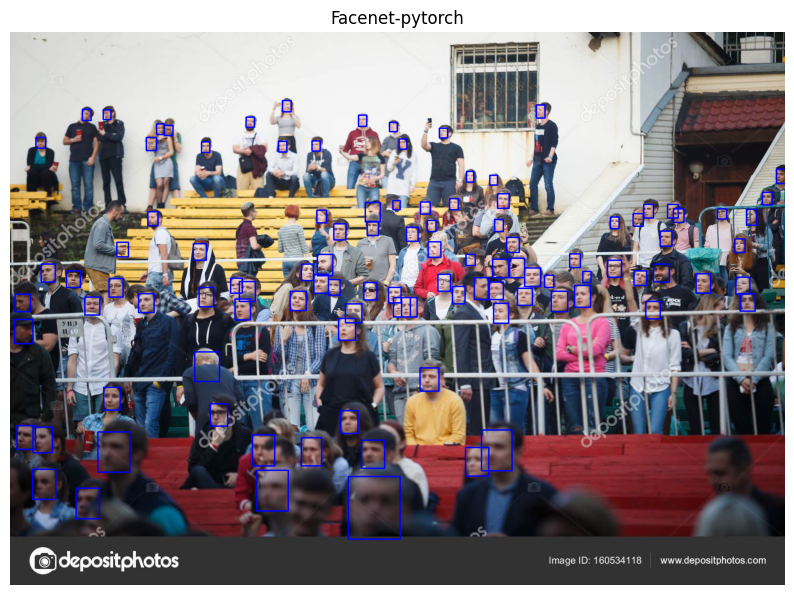

In [25]:
from facenet_pytorch import MTCNN
import matplotlib.pyplot as plt
import cv2

img_bgr = cv2.imread(img_path)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

mtcnn = MTCNN(keep_all=False, post_process=False, device=device)
boxes, probs = mtcnn.detect(img, landmarks=False)

for bbox in boxes:
    box = bbox.astype(int)
    x1,y1,x2,y2=box[0:4]
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
    
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(img)
plt.title('Facenet-pytorch')

#### 5.2.3 Intersection over union (IoU) on validation set

The model clearly has fewer false positives than the large YOLO model, a similar number of false negatives, and a few less true positives. This model would be a serious contender at this point if it didn't take so much longer to run.

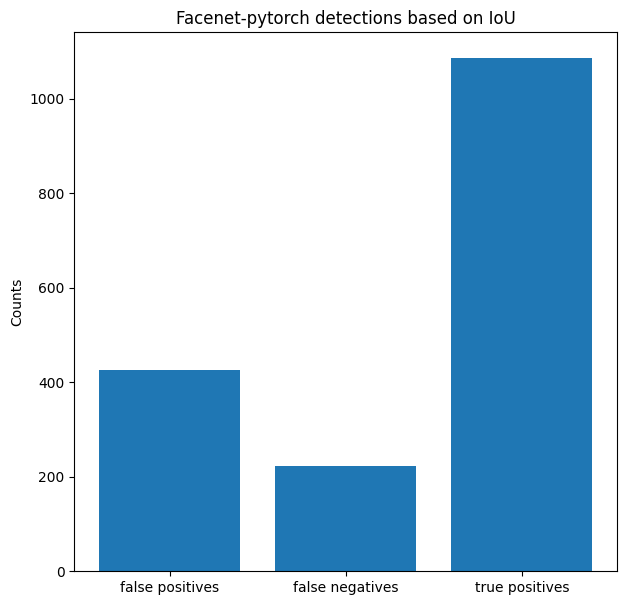

In [27]:
from facenet_pytorch import MTCNN
import torch

def iou_facenet_pytorch_bboxes_categorization_plot(model: MTCNN, model_name: str, gt_data: dict):
    all_pred_bboxes = []
    for img_data in gt_data:
        img = img_data['img']
        boxes, probs = model.detect(img, landmarks=False)
        if boxes is not None:
            all_pred_bboxes.append(torch.tensor(boxes.astype(float), dtype=float))
        else:
            all_pred_bboxes.append(torch.tensor([[]], dtype=float))
    return iou_plot_fp_fn_tp(gt_data, all_pred_bboxes, 0.3, model_name)


model = MTCNN(keep_all=False, post_process=False, device=device)
facenet_pytorch_iou_classifications = iou_facenet_pytorch_bboxes_categorization_plot(model, 'Facenet-pytorch', data_val)

### 5.3. RetinaFace

An older model, but supposed to be extremely accurate. The downside is its speed, which is very slow (as seen below). I was unable to find a way to run this version of it on the GPU.

#### 5.3.1 Runtime

As seen below, RetinaFace is very slow compared to other models. I am dropping it from contention due to its speed alone.

In [24]:
import cv2
from matplotlib import pyplot as plt
from retinaface.pre_trained_models import get_model
import timeit

n_iter = 20

img_bgr = cv2.imread(img_path)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

model = get_model("resnet50_2020-07-20", max_size=2048)
runtime = timeit.timeit(lambda: model.predict_jsons(img), number=n_iter)

print(f'Model runtime on CPU: {runtime/n_iter:.3f}s per iteration')

c:\Users\ellis\miniconda3\envs\emoface\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ellis\miniconda3\envs\emoface\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
c:\Users\ellis\miniconda3\envs\emoface\Lib\site-packages\torch\hub.py:684: UserWarning: Falling back to the old format < 1.6. This support will be deprecated in favor of default zipfile format introduced in 1.6. Please redo torch.save() to save it in the new zipfile format.
  warnings.warn('Falling back to the old format < 1.6. This support will be '


Model runtime on CPU: 5.012s per iteration


#### 5.3.2. Visual test on a single image

RetinaFace is supposed to be highly accurate, but we can see below that it misses some faces that were picked up by the large YOLOv8-face model.

c:\Users\ellis\miniconda3\envs\emoface\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ellis\miniconda3\envs\emoface\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
c:\Users\ellis\miniconda3\envs\emoface\Lib\site-packages\torch\hub.py:684: UserWarning: Falling back to the old format < 1.6. This support will be deprecated in favor of default zipfile format introduced in 1.6. Please redo torch.save() to save it in the new zipfile format.
  warnings.warn('Falling back to the old format < 1.6. This support will be '


Text(0.5, 1.0, 'RetinaFace')

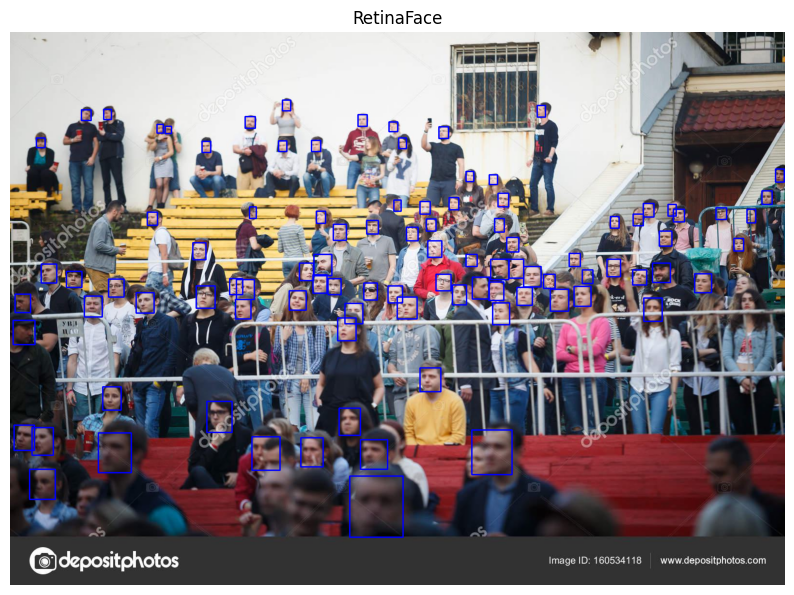

In [26]:
import cv2
from matplotlib import pyplot as plt
from retinaface.pre_trained_models import get_model

img_bgr = cv2.imread(img_path)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

model = get_model("resnet50_2020-07-20", max_size=2048)
faces = model.predict_jsons(img)

for face in faces:
    box = face['bbox']
    x1,y1,x2,y2=box[0:4]
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)

plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(img)
plt.title('RetinaFace')

#### 5.3.3 Intersection over union (IoU) on validation set

I did not perform this test because I am rejecting the model on speed grounds. I would only perform it if the rest of the models were performing particularly badly, which they are not.

### 5.4. Batch-face (RetinaFace)

Batch-face, found at github.com/elliottzheng/batch-face, is supposed to include very fast face detection. It is described as being "ultrafast," which implies that it uses a small model.

#### 5.4.1. Runtime

Despite the alleged speed, it turns out to be slower than the large YOLO face model when both are running on the GPU.

In [89]:
import cv2
from batch_face import RetinaFace
import timeit

n_iter = 100

img_bgr = cv2.imread(img_path)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

detector = RetinaFace(gpu_id=0)
runtime_gpu = timeit.timeit(lambda: detector(img, cv=False), number=n_iter)

detector = RetinaFace(gpu_id=-1)
runtime_cpu = timeit.timeit(lambda: detector(img, cv=False), number=n_iter)

print(f'Model runtime on GPU: {runtime_gpu/n_iter:.3f}s per iteration')
print(f'Model runtime on CPU: {runtime_cpu/n_iter:.3f}s per iteration')

Model runtime on GPU: 0.256s per iteration
Model runtime on CPU: 0.410s per iteration


#### 5.4.2. Visual test on a single image

As we can see below, batch-face, while decent at detecting real faces, also have more false positives in this case than the large YOLO model, despite being slower.

Text(0.5, 1.0, 'Batch-face')

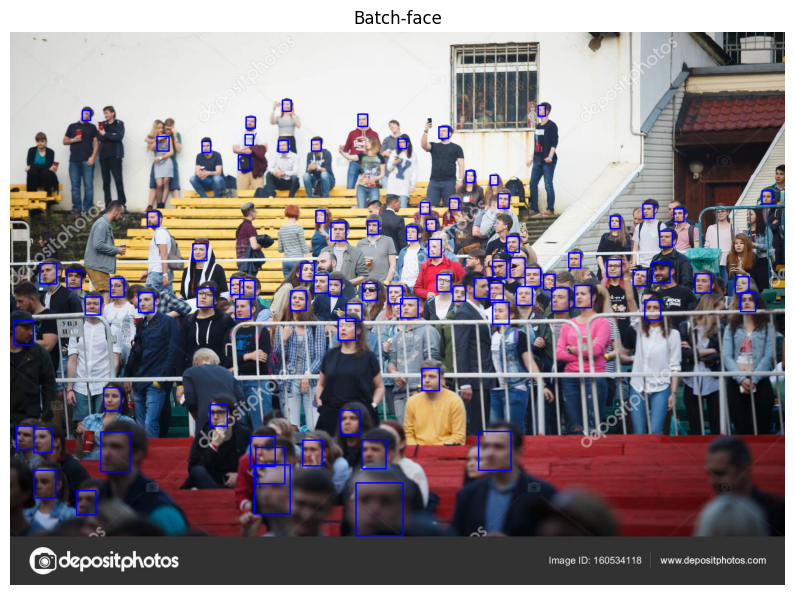

In [90]:
import cv2
from batch_face import RetinaFace
import matplotlib.pyplot as plt

img_bgr = cv2.imread(img_path)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

detector = RetinaFace(gpu_id=0)
faces = detector(img, cv=False)

for face in faces:
    box, landmark, score = face
    box = box.astype(int)
    x1,y1,x2,y2=box[0:4]
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
    
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(img)
plt.title('Batch-face')

#### 5.4.3 Intersection over union (IoU) on validation set

Batch-face clearly has a lot more false negatives than the YOLO medium and large models and Facenet-pytorch. That alone will lead to its rejection.

C:\Users\ellis\AppData\Local\Temp\ipykernel_131300\3250451525.py:13: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:277.)
  boxes_tensor = torch.tensor(boxes, dtype=float)


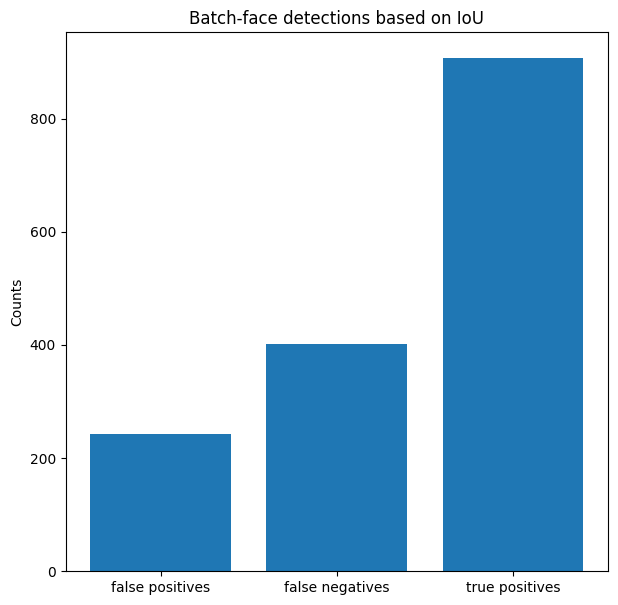

In [29]:
from batch_face import RetinaFace
import torch

def iou_batch_face_bboxes_categorization_plot(model: RetinaFace, model_name: str, gt_data: dict):
    all_pred_bboxes = []
    for img_data in gt_data:
        img = img_data['img']
        faces = model(img, cv=False)
        boxes = []
        for face in faces:
            box, landmark, score = face
            boxes.append(box)
        boxes_tensor = torch.tensor(boxes, dtype=float)
        all_pred_bboxes.append(boxes_tensor)
    return iou_plot_fp_fn_tp(gt_data, all_pred_bboxes, 0.3, model_name)


model = RetinaFace(gpu_id=0)
batch_face_iou_classifications = iou_batch_face_bboxes_categorization_plot(model, 'Batch-face', data_val)

### 5.5. Intersection over union comparison across models

To make a true model decision, we need to put the results on a single plot and make a direct comparison. In the plot below, we can clearly see that YOLO-large and YOLO-medium perform the best in terms of false negatives and true positives. However, they perform the worst in terms of false positives. But there is a caveat, in that I did not label a face if I could not make out its expression. Therefore, many false positives are likely to be faces that I did not label, as seen in the crowd in the second image in section 5.0.1. Therefore, given scalability and the fact that many of those false positives can be eliminated with hyperparameter tuning, I will move forward with the large YOLO model.

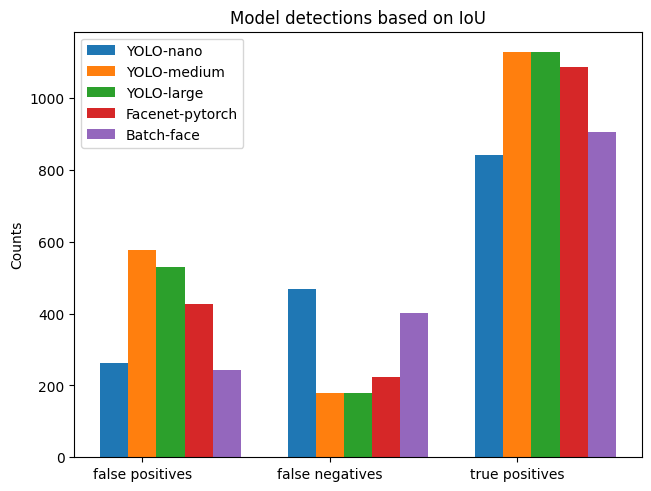

In [41]:
import matplotlib.pyplot as plt

dataset_labels = ['YOLO-nano', 'YOLO-medium', 'YOLO-large', 'Facenet-pytorch', 'Batch-face']

datasets = [yolon_iou_classifications, yolom_iou_classifications, yolol_iou_classifications,
            facenet_pytorch_iou_classifications, batch_face_iou_classifications]

datapoint_names = ['fp', 'fn', 'tp']


x = np.arange(3)  # the label locations
width = 0.15  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for label, dataset in zip(dataset_labels, datasets):
    datapts = dataset.values()
    offset = width * multiplier
    rects = ax.bar(x + offset, datapts, width, label=label)
    # ax.bar_label(rects, padding=6)
    multiplier += 1

ax.set_xticks(x + width, ['false positives', 'false negatives', 'true positives'])
ax.legend(loc='upper left')
ax.set_ylabel('Counts')
ax.set_title('Model detections based on IoU')

plt.show()

## 6. Build the final model

In [5]:
# Some shared info
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

### 6.1. The EmoSense class

Since the goal is to making things modular, we need something we can setup that can take in the models and put them together to produce the correct output. The way that came to mind is to use a class like Pytorch and TensorFlow do, which initializes an object using all the models passed to it. Then, once instantiated, it will take an image and output the necessary information. To make the class truly modular, each model will need to be intantiated in an outside wrapper. As a side effect, the class doesn't care which framework is used.

The workflow is as follows: \
Image -> Detect and crop faces -> Filter out unwanted faces -> Transform faces -> Detect expressions -> Aggregate expressions -> Overall emotion

To calculate the overall emotion, I default to just adding the emotion probabilities and taking the max.

After writing the class, I realized that using a simple pipe might be easier. That's really all the class is doing at this point. However, the class does add some API requirements that the functions passed into need to meet, which adds some structure.

In [6]:
import numpy as np

class EmoSense():
    """
    A class to combine multiple models and functions to produce a workflow object that,
    when called on an RGB image, predicts the aggregate emotion of all the usable faces
    in that image.
    """
    
    def __init__(self, face_detector: callable, expression_recognizer: callable, 
                 face_filter: callable = None, face_transformer: callable = None,
                 aggregator: callable = None):
        """
        Gathers the models and functions for the workflow.

        Args:
            face_detector (callable): face detector, takes and image and returns
                bounding boxes (xyxy format) and confidence scores as NumPy arrays
            expression_recognizer (callable): face expression recognizer, takes a list
                of face images and returns a list/array of (integer) expression classes
                and a 2D NumPy array (N pics x M classes) of probabilities for each
                expression
            face_filter (callable, optional): face filter, takes a list of face images
                and returns a boolen list of which ones to keep. Defaults to None.
            face_transformer (callable, optional): face transformer, takes a list of
                face images and performs transformation on them. Defaults to None.
            aggregator (callable, optional): Takes the face confidence scores and 
                expression probabilities and calculates the aggregate emotion class
                (an int). Defaults to None, in which case the expression class which has
                the maximum of the sum of the probabilities is used.
        """
        self.detector = face_detector
        self.recognizer = expression_recognizer
        self.filter = face_filter
        self.transformer = face_transformer
        self.aggregator = aggregator
        return
    
    def __call__(self, img: np.ndarray) -> tuple[int, dict]:
        """
        Takes an image and runs the workflow on it to determine the aggregate
        emotion from the usable facial expressions in that image. Extracts faces,
        filters out faces, transforms faces, recognizes expressions, and finally
        calculates the aggregate expression.

        Args:
            img (np.ndarray): An RGB image with faces in it.

        Returns:
            tuple[int, dict]: The aggregate expression class and the image face data. 
                Face data includes the bounding boxes, the associated confidence level,
                the face's expression class, and that expression's associated
                probabilities.
        """
        self.img = img
        self._extract_faces()
        self._filter_faces()
        self._transform_faces()
        self._recognize_expressions()
        self._combine_data()
        return self._overall_emotion(), self.faces_data
    
    def _extract_faces(self) -> None:
        """
        Detects faces using the model saved in self.detector, which returns the bounding
        boxes and confidence levels. Then it extracts the faces from the image and saves
        them in a list. 
        """
        bboxes, confs = self.detector(self.img)
        self.bboxes = bboxes
        self.face_confs = confs
        faces = []
        for bbox in bboxes:
            box = bbox.astype(int)
            x1,y1,x2,y2=box[0:4]
            face = self.img[y1:y2, x1:x2, :]
            faces.append(face)
        self.faces = faces
        return
    
    def _filter_faces(self) -> None:
        """
        Filters out faces based on the function stored in self.filter based on the face
        images and confidences.
        """
        if self.filter is None:
            self.filtered_faces = self.faces
            return
        
        to_keep = self.filter(self.faces, self.face_confs)
        # self.filtered_bboxes = [self.bboxes[i] for i, keep in enumerate(to_keep) if keep]
        self.filtered_bboxes = self.bboxes[to_keep, :]
        # self.filtered_face_confs = [self.face_confs[i] for i, keep in enumerate(to_keep) if keep]
        self.filtered_face_confs = self.face_confs[to_keep]
        self.filtered_faces = [self.faces[i] for i, keep in enumerate(to_keep) if keep]
        return
        
    def _transform_faces(self) -> None:
        """
        Transforms faces directly by calling the function stored in self.transformer.
        """
        if self.transformer is None:
            self.transformed_faces = self.filtered_faces
            return

        self.transformed_faces = self.transformer(self.filtered_faces)
        return
    
    def _recognize_expressions(self) -> None:
        """
        Finds the face expression classes and the expression probabilities for all faces
        by directly calling the facial expression recognizer.
        """
        if self.transformed_faces:
            expr_classes, probs = self.recognizer(self.transformed_faces)
            self.expression_classes = expr_classes
            self.expression_probs = probs
        else:
            self.expression_classes = np.array([])
            self.expression_probs = np.array([[]])
        return
    
    def _combine_data(self) -> None:
        """
        Takes the data to be returned from four lists and sticks them in a dict for easy
        understanding.
        """
        self.faces_data  = {
            'bbox': self.filtered_bboxes,
            'face_confidence': self.filtered_face_confs,
            'expression_class': self.expression_classes,
            'expression_probabilities': self.expression_probs
            }
        return
    
    def _overall_emotion(self) -> int:
        if self.expression_probs.size == 0:
            return None
        
        if self.aggregator is None:
            return np.ndarray([self.expression_probs.sum(axis=0).argmax()])
        
        return self.aggregator(self.filtered_face_confs, self.expression_probs)

### 6.2. Face detection model and wrapper

For face detection, we use the YOLOv8-face large model and run it on the GPU.

In [7]:
from ultralytics import YOLO

yolo_model_path = 'yolov8-face/yolov8l-face.pt'

yolo_model = YOLO(yolo_model_path)
yolo_model.to(device)

def yolo_emosense_wrapper(img: np.ndarray) -> tuple[np.ndarray, np.ndarray]:
    """
    Wraps the YOLO model for running with the EmoSense class.

    Args:
        img (np.ndarray): The input image of the group

    Returns:
        tuple[np.ndarray, np.ndarray]: The bounding boxes for all detected faces and
            their corresponding confidence levels.
    """
    results = yolo_model(img)
    bboxes = results[0].boxes.xyxy.cpu().numpy().astype(int)
    confs = results[0].boxes.conf.cpu().numpy()
    return bboxes, confs


### 6.3. Face image filter

I use two filters. The first filter makes sure that the largest dimension meets a minimum number of pixels. The second makes sure that the confidence level meets a minimum threshold.

In [42]:
import numpy as np

def face_filter_combined(face_imgs: list, face_confs: np.ndarray, min_pixels: int, 
                         conf_threshold: float) -> np.ndarray:
    """
    Calls all the filters and returns the aggregate result.

    Args:
        face_imgs (list): List of face images (stored as numpy arrays)
        face_confs (np.ndarray): 1D array of face confidence levels
        min_pixels (int): The minimum number of pixels the largest face image 
            dimension should have
        conf_threshold (float): The minimum confidence threshold

    Returns:
        np.ndarray: A 1D boolean array of face images to keep
    """
    to_keep_1 = face_filter_pixels(face_imgs, min_pixels)
    to_keep_2 = face_filter_confidence(face_confs, conf_threshold)
    if len(to_keep_1) == 0:
        return np.array([], dtype=bool)
    else:
        return to_keep_1 & to_keep_2

def face_filter_pixels(face_imgs: list, min_pixels: int) -> np.ndarray:
    """
    Determines which face images have their largest dimension meeting the required
    minimum number of pixels.
    
    Args:
        face_imgs (list): List of face images (stored as numpy arrays)
        min_pixels (int): The minimum number of pixels the largest dimension should have

    Returns:
        np.ndarray: A 1D boolean array of face images to keep
    """
    to_keep = np.array([max(face.shape) >= min_pixels for face in face_imgs])
    return to_keep

def face_filter_confidence(face_confs: np.ndarray, conf_threshold: float) -> np.ndarray:
    """
    Determines which face images have their confidence level meeting a minimum
    threshold.
    
    Args:
        face_confs (np.ndarray): 1D array of face confidence levels
        conf_threshold (float): The minimum threshold
        
    Returns:
        np.ndarray: A 1D boolean array of face images to keep
    """
    return face_confs > conf_threshold

### 6.4. Face transformer

I don't have a face transformer. Options include super-resolution models, face deblur models, and face alignment, among others. I would like to test ELSFace if I have time, but that is unlikely.


### 6.5. Face expression recognizer

I use the HSEmotion library with the enet_b2_7 model.

In [9]:
from hsemotion.facial_emotions import HSEmotionRecognizer

model_name = 'enet_b2_7'
fer = HSEmotionRecognizer(model_name=model_name, device=device)

def hsemotion_emosense_wrapper(face_imgs: list) -> tuple[np.ndarray, np.ndarray]:
    """
    Runs HSEmotion on a list of face images, returning the list of corresponding
    expression classes and 2D array of probabilities.

    Args:
        face_imgs (list): The list of face images to detect the expressions of

    Returns:
        tuple[np.ndarray, np.ndarray]: A list/array of (integer) expression classes
                and a 2D NumPy array (N pics x M classes) of correspodnding
                probabilities for each face.
    """
    _, probs = fer.predict_multi_emotions(face_imgs, logits=False)
    return probs.argmax(axis=1), probs

c:\Users\ellis\miniconda3\envs\emoface\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


C:\Users\ellis\.hsemotion\enet_b2_7.pt Compose(
    Resize(size=(260, 260), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


### 6.6. Emotion aggregators

I setup three emotion aggregators to be tested:
1. Find the class for each expression, then from those find the most common class(es) across all expressions.
2. Add up the probabilities across all expressions, then find the index of the max (the expression's class).
3. Take the probabilities for each expression and multiply them by the confidence level from the face detection. Add up the probability-confidence products, and find the index of the max (the expression's class).

In [10]:
import numpy as np

def most_common_expression_classes(confs: np.ndarray, probs: np.ndarray) -> np.ndarray:
    """
    Finds the aggregate emotion of the faces by finding the expression class(es) that
    occur most frequently.

    Args:
        confs (np.ndarray): The confidence level of the face detection. Not used.
        probs (np.ndarray): The (N pics x M classes) array of expression probabilities.

    Returns:
        np.ndarray: The most common expression classes.
    """
    classes = probs.argmax(axis=1)
    counts = np.bincount(classes)
    most_common_classes = np.where(counts==counts.argmax())
    return most_common_classes

def most_probable_expression(confs: np.ndarray, probs: np.ndarray) -> np.ndarray:
    """
    Finds the aggregate emotion of the faces by summing the probabililities of each
    each expression across the faces used, then finding maximum one.

    Args:
        confs (np.ndarray): The confidence level of the face detection. Not used.
        probs (np.ndarray): The (N pics x M classes) array of expression probabilities.

    Returns:
        np.ndarray: The most common expression classes.
    """
    probs_sum = probs.sum(axis=0)
    return np.array([probs_sum.argmax()])

def max_confidence_probability_multiple(confs: np.ndarray, probs: np.ndarray) -> np.ndarray:
    """
    Finds the aggregate emotion of the faces by multiplying the probabilities for each
    face by its confidence level, summing across the faces, then finding the max index.

    Args:
        confs (np.ndarray): The confidence level of the face detection. Not used.
        probs (np.ndarray): The (N pics x M classes) array of expression probabilities.

    Returns:
        np.ndarray: The most common expression classes.
    """
    confs_prob_mult = probs * confs.T
    confs_prob_mult_sum = confs_prob_mult.sum(axis=0)
    return np.array([confs_prob_mult_sum.argmax()])
    

### 6.7 Metrics (mean average precision)

#### 6.7.1. Extracting and combining data
A problem immediately arises with the use of metrics. They require comparing with a ground truth, and that requires aligning the data from the ground truth with the predicted data. In many cases, this data will not be aligned by default because we will have false posititives and false negatives. Therefore, I must rearrange the data to use in the metrics. The functions below do this by first finding the true positives and aligning ground truth labels (class ids) with the order of their probabilities form the prediction. Then it finds all the false positives and tacks them on to the labels with -1 as the label, along with appending the remaining probabilities for to the true positive probabilities. Finally, it tacks on the labels for the false negatives along with assignining zero for their probabilities. It treats the confidence score the same way as probabilities. This format should be useful for calculating the mean average precision.

In [29]:
import numpy as np
import torch
import torchvision
from sklearn.metrics import average_precision_score

def combined_data_for_metrics(gt_data: dict, all_pred_data: dict, n_gt_classes: int, 
                              iou_threshold: float) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    all_class_ids = []
    all_probs = []
    all_confs = []
    for img_data, pred_data in zip(gt_data, all_pred_data):
        class_ids, probs, confs = align_gt_and_pred(img_data, pred_data, n_gt_classes, iou_threshold)
        all_class_ids.append(class_ids)
        all_probs.append(probs)
        all_confs.append(confs)
    combined_class_ids = np.concatenate(all_class_ids, axis=0)
    combined_probs = np.concatenate(all_probs, axis=0)
    combined_confs = np.concatenate(all_confs, axis=0)
    return combined_class_ids, combined_probs, combined_confs
    
    
def align_gt_and_pred(img_data: dict, pred_data: dict, n_gt_classes: int, 
                      iou_threshold: float) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    gt_bboxes = img_data['xyxy']
    pred_bboxes = torch.tensor(pred_data['bbox'], dtype=float)
    if gt_bboxes.nelement() == 0 and pred_bboxes.nelement() == 0:
        return np.array([]), np.zeros((0, n_gt_classes)), np.array([])
    elif gt_bboxes.nelement() == 0 and pred_bboxes.nelement() != 0:
        return -1*np.ones(pred_bboxes.shape[0]), pred_data['expression_probabilities'], pred_data['face_confidence']
    elif gt_bboxes.nelement() != 0 and pred_bboxes.nelement() == 0:
        return img_data['class_id'], np.zeros((gt_bboxes.shape[0], n_gt_classes)), np.zeros(gt_bboxes.shape[0])
    else:
        gt_tp, pred_tp, pred_gt_map = gt_pred_iou_tp(gt_bboxes, pred_bboxes, iou_threshold)
        class_ids_tp = img_data['class_id'][pred_gt_map]
        class_ids_fp = -1*np.ones(sum(~pred_tp))
        class_ids_fn = img_data['class_id'][~gt_tp]
        class_ids = np.concatenate((class_ids_tp, class_ids_fp, class_ids_fn), axis=0)
        probs_tp = pred_data['expression_probabilities'][pred_tp, :]
        probs_fp = pred_data['expression_probabilities'][~pred_tp, :]
        probs_fn = np.zeros((sum(~gt_tp), n_gt_classes))
        probs = np.concatenate((probs_tp, probs_fp, probs_fn), axis=0)
        confs_tp = pred_data['face_confidence'][pred_tp]
        confs_fp = pred_data['face_confidence'][~pred_tp]
        confs_fn = np.zeros(sum(~gt_tp))
        confs = np.concatenate((confs_tp, confs_fp, confs_fn), axis=0)
        return class_ids, probs, confs
        
        
        
def gt_pred_iou_tp(gt_bboxes: torch.tensor, pred_bboxes: torch.tensor, iou_threshold: float) -> tuple[np.ndarray, np.ndarray]:
    iou = torchvision.ops.box_iou(gt_bboxes, pred_bboxes)
    # which ground truth bounding boxes are true positives
    gt_tp = np.ones(gt_bboxes.shape[0]).astype(bool)  
    # which predicted bounding boxes are true positives
    pred_tp = np.ones(pred_bboxes.shape[0]).astype(bool)
    # Given a predicted true positive bounding box, which ground truth does it map to?  
    pred_gt_map = []
    for r in range(iou.shape[0]):
        if iou[r,:].max() <= iou_threshold or iou[:,iou[r,:].argmax()].argmax() != r:
            gt_tp[r] = False
        
    for c in range(iou.shape[1]):
        to_gt_idx = iou[:,c].argmax()
        if iou[:,c].max() <= iou_threshold or iou[to_gt_idx,:].argmax() != c:
            pred_tp[c] = False
        else:
            pred_gt_map.append(to_gt_idx)
            
    return gt_tp, pred_tp, pred_gt_map

#### 6.7.2. Mean average precision
I calculate mean average precision two ways. First, by using just the probabilities. Second, by multiplying the probababilities by their confidence score to produce a combined probability.

In [12]:
def mean_average_precision_probs(class_ids: np.ndarray, probs: np.ndarray, n_gt_classes: int) -> float:
    """
    Mean average precision with just probabilities.
    """
    ap = [0] * n_gt_classes
    for cls in range(n_gt_classes):
        ap[cls] = average_precision_score(class_ids==cls, probs[:, cls])
    mean_ap = np.mean(ap)
    return mean_ap

def mean_average_precision_probs_confs(class_ids: np.ndarray, probs: np.ndarray, confs: np.ndarray, n_gt_classes: int) -> float:
    """
    Mean average precision with probabilities multiplied by confidence level.
    """
    ap = [0] * n_gt_classes
    for cls in range(n_gt_classes):
        ap[cls] = average_precision_score(class_ids==cls, probs[:, cls]*confs)
    mean_ap = np.mean(ap)
    return mean_ap

### 6.8. Test the combined EmoSense model

I test the model on the validation set and scan across various hyperparameters. Then, using the optimal hyperparameters, run the model on the test set.

In [13]:
# a basic run
group_fer = EmoSense(
    face_detector = yolo_emosense_wrapper,
    face_filter = lambda x1, x2: face_filter_combined(x1, x2, 35, 0.3),
    face_transformer = None,
    expression_recognizer = hsemotion_emosense_wrapper,
    aggregator = most_probable_expression
    )

all_aggregate_moods = []
all_pred_data = []
for img_data in data_val:
    aggregate_mood, pred_data = group_fer(img_data['img'])
    all_aggregate_moods.append(aggregate_mood)
    all_pred_data.append(pred_data)
    



0: 640x960 4 faces, 125.5ms
Speed: 6.5ms preprocess, 125.5ms inference, 105.5ms postprocess per image at shape (1, 3, 640, 960)

0: 544x960 11 faces, 119.1ms
Speed: 4.5ms preprocess, 119.1ms inference, 3.0ms postprocess per image at shape (1, 3, 544, 960)

0: 960x640 14 faces, 116.5ms
Speed: 4.0ms preprocess, 116.5ms inference, 2.0ms postprocess per image at shape (1, 3, 960, 640)

0: 736x960 11 faces, 118.2ms
Speed: 4.0ms preprocess, 118.2ms inference, 1.0ms postprocess per image at shape (1, 3, 736, 960)

0: 640x960 17 faces, 16.3ms
Speed: 4.0ms preprocess, 16.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 960)

0: 736x960 35 faces, 16.0ms
Speed: 4.8ms preprocess, 16.0ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 960)

0: 736x960 12 faces, 15.5ms
Speed: 4.5ms preprocess, 15.5ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 960)

0: 896x960 4 faces, 118.2ms
Speed: 6.5ms preprocess, 118.2ms inference, 2.1ms postprocess per image at shape

In [30]:
combined_class_ids, combined_probs, combined_confs = \
    combined_data_for_metrics(data_val, all_pred_data, len(classes), 0.3)

In [34]:
map_probs = mean_average_precision_probs(combined_class_ids, combined_probs, len(classes))
map_probs_confs = mean_average_precision_probs_confs(combined_class_ids, combined_probs, combined_confs, len(classes))
print(f'mAP with just probabilities: {map_probs:.3f}')
print(f'mAP with probabilities confidence levels: {map_probs_confs:.3f}')

mAP with just probabilities: 0.285
mAP with probabilities confidence levels: 0.305


Scan across hyperparameters and find the best parameters using mean average precision with just probabiliites. Optimal pixel threshold is 20 and confidence threshold is 0.4.

In [35]:
map_opt = 0

for pix in [10, 20, 30, 35]:
    for conf_threshold in [0.0, 0.1, 0.2, 0.3, 0.4]:
        group_fer = EmoSense(
            face_detector = yolo_emosense_wrapper,
            face_filter = lambda x1, x2: face_filter_combined(x1, x2, pix, conf_threshold),
            face_transformer = None,
            expression_recognizer = hsemotion_emosense_wrapper,
            aggregator = most_probable_expression
            )

        all_aggregate_moods = []
        all_pred_data = []
        for img_data in data_val:
            aggregate_mood, pred_data = group_fer(img_data['img'])
            all_aggregate_moods.append(aggregate_mood)
            all_pred_data.append(pred_data)
            
        combined_class_ids, combined_probs, combined_confs = \
            combined_data_for_metrics(data_val, all_pred_data, len(classes), 0.3)
            
        map_probs = mean_average_precision_probs(combined_class_ids, combined_probs, len(classes))
        if map_probs > map_opt:
            map_opt = map_probs
            opt_pix = pix
            opt_conf_threshold = conf_threshold
            
print('Optimal hyperparameters:')
print(f'pixel threshold: {opt_pix}')
print(f'Confidence threshold: {opt_conf_threshold}')
print(f'Optimal mAP: {map_opt:.3f}')


0: 640x960 4 faces, 160.1ms
Speed: 8.5ms preprocess, 160.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 960)

0: 544x960 11 faces, 22.6ms
Speed: 5.1ms preprocess, 22.6ms inference, 4.0ms postprocess per image at shape (1, 3, 544, 960)

0: 960x640 14 faces, 27.6ms
Speed: 6.5ms preprocess, 27.6ms inference, 3.0ms postprocess per image at shape (1, 3, 960, 640)

0: 736x960 11 faces, 25.5ms
Speed: 5.5ms preprocess, 25.5ms inference, 3.3ms postprocess per image at shape (1, 3, 736, 960)

0: 640x960 17 faces, 27.1ms
Speed: 5.5ms preprocess, 27.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 960)

0: 736x960 35 faces, 23.0ms
Speed: 5.5ms preprocess, 23.0ms inference, 2.1ms postprocess per image at shape (1, 3, 736, 960)

0: 736x960 12 faces, 28.7ms
Speed: 5.0ms preprocess, 28.7ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 960)

0: 896x960 4 faces, 21.0ms
Speed: 6.9ms preprocess, 21.0ms inference, 1.5ms postprocess per image at shape (1, 3, 89

Scan across hyperparameters and find the best parameters using mean average precision with probabiliites and confidence levels. As above, optimal pixel threshold is 20 and confidence threshold is 0.4.

In [37]:
map_opt = 0

for pix in [10, 20, 30, 35]:
    for conf_threshold in [0.0, 0.1, 0.2, 0.3, 0.4]:
        group_fer = EmoSense(
            face_detector = yolo_emosense_wrapper,
            face_filter = lambda x1, x2: face_filter_combined(x1, x2, pix, conf_threshold),
            face_transformer = None,
            expression_recognizer = hsemotion_emosense_wrapper,
            aggregator = most_probable_expression
            )

        all_aggregate_moods = []
        all_pred_data = []
        for img_data in data_val:
            aggregate_mood, pred_data = group_fer(img_data['img'])
            all_aggregate_moods.append(aggregate_mood)
            all_pred_data.append(pred_data)
            
        combined_class_ids, combined_probs, combined_confs = \
            combined_data_for_metrics(data_val, all_pred_data, len(classes), 0.3)
            
        map_probs = mean_average_precision_probs_confs(combined_class_ids, combined_probs, combined_confs, len(classes))
        if map_probs > map_opt:
            map_opt = map_probs
            opt_pix = pix
            opt_conf_threshold = conf_threshold
            
print('Optimal hyperparameters:')
print(f'pixel threshold: {opt_pix}')
print(f'Confidence threshold: {opt_conf_threshold}')
print(f'Optimal mAP: {map_opt:.3f}')


0: 640x960 4 faces, 497.5ms
Speed: 5.0ms preprocess, 497.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 960)

0: 544x960 11 faces, 17.0ms
Speed: 4.0ms preprocess, 17.0ms inference, 2.0ms postprocess per image at shape (1, 3, 544, 960)

0: 960x640 14 faces, 20.0ms
Speed: 5.1ms preprocess, 20.0ms inference, 2.0ms postprocess per image at shape (1, 3, 960, 640)

0: 736x960 11 faces, 95.5ms
Speed: 4.0ms preprocess, 95.5ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 960)

0: 640x960 17 faces, 21.6ms
Speed: 4.0ms preprocess, 21.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 960)

0: 736x960 35 faces, 19.0ms
Speed: 5.0ms preprocess, 19.0ms inference, 2.5ms postprocess per image at shape (1, 3, 736, 960)

0: 736x960 12 faces, 17.5ms
Speed: 4.5ms preprocess, 17.5ms inference, 1.0ms postprocess per image at shape (1, 3, 736, 960)

0: 896x960 4 faces, 221.9ms
Speed: 6.1ms preprocess, 221.9ms inference, 1.5ms postprocess per image at shape (1, 3, 

Run optimal parameters on validation set

In [55]:
import time

pix = 20
conf_threshold = 0.4

group_fer = EmoSense(
    face_detector = yolo_emosense_wrapper,
    face_filter = lambda x1, x2: face_filter_combined(x1, x2, pix, conf_threshold),
    face_transformer = None,
    expression_recognizer = hsemotion_emosense_wrapper,
    aggregator = most_probable_expression
    )

all_aggregate_moods = []
all_pred_data = []
start = time.time()
for img_data in data_val:
    aggregate_mood, pred_data = group_fer(img_data['img'])
    all_aggregate_moods.append(aggregate_mood)
    all_pred_data.append(pred_data)
end = time.time()


combined_class_ids, combined_probs, combined_confs = \
    combined_data_for_metrics(data_val, all_pred_data, len(classes), 0.3)
    
map_probs = mean_average_precision_probs(combined_class_ids, combined_probs, len(classes))
map_probs_confs = mean_average_precision_probs_confs(combined_class_ids, combined_probs, combined_confs, len(classes))
print('Test set results:')
print(f'mAP with just probabilities: {map_probs:.3f}')
print(f'mAP with probabilities confidence levels: {map_probs_confs:.3f}')
print(f'Runtime average: {(end-start)/len(data_test):.2f}s per picture')


0: 640x960 4 faces, 309.8ms
Speed: 8.5ms preprocess, 309.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 960)

0: 544x960 11 faces, 28.1ms
Speed: 5.5ms preprocess, 28.1ms inference, 2.0ms postprocess per image at shape (1, 3, 544, 960)

0: 960x640 14 faces, 25.4ms
Speed: 13.0ms preprocess, 25.4ms inference, 1.0ms postprocess per image at shape (1, 3, 960, 640)

0: 736x960 11 faces, 24.6ms
Speed: 5.5ms preprocess, 24.6ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 960)

0: 640x960 17 faces, 23.6ms
Speed: 5.1ms preprocess, 23.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 960)

0: 736x960 35 faces, 29.6ms
Speed: 11.2ms preprocess, 29.6ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 960)

0: 736x960 12 faces, 24.8ms
Speed: 8.5ms preprocess, 24.8ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 960)

0: 896x960 4 faces, 37.6ms
Speed: 8.5ms preprocess, 37.6ms inference, 3.0ms postprocess per image at shape (1, 3, 

<Figure size 1500x1500 with 0 Axes>

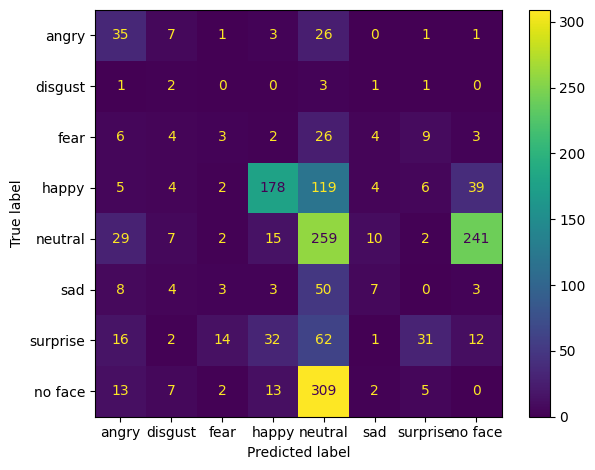

In [56]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

gt_class_ids_for_confusion = combined_class_ids.copy()
gt_class_ids_for_confusion[gt_class_ids_for_confusion==-1] = 7

pred_class_ids_for_confusion = combined_probs.argmax(axis=1)
pred_class_ids_for_confusion[combined_probs.max(axis=1)==0.0] = 7

labels = [*classes, 'no face']

plt.figure(figsize=(15, 15))
ConfusionMatrixDisplay.from_predictions(gt_class_ids_for_confusion, pred_class_ids_for_confusion, display_labels=labels)
plt.tight_layout()

Run on test set

In [57]:
import time

pix = 20
conf_threshold = 0.4

group_fer = EmoSense(
    face_detector = yolo_emosense_wrapper,
    face_filter = lambda x1, x2: face_filter_combined(x1, x2, pix, conf_threshold),
    face_transformer = None,
    expression_recognizer = hsemotion_emosense_wrapper,
    aggregator = most_probable_expression
    )

all_aggregate_moods = []
all_pred_data = []
start = time.time()
for img_data in data_test:
    aggregate_mood, pred_data = group_fer(img_data['img'])
    all_aggregate_moods.append(aggregate_mood)
    all_pred_data.append(pred_data)
end = time.time()


combined_class_ids, combined_probs, combined_confs = \
    combined_data_for_metrics(data_test, all_pred_data, len(classes), 0.3)
    
map_probs = mean_average_precision_probs(combined_class_ids, combined_probs, len(classes))
map_probs_confs = mean_average_precision_probs_confs(combined_class_ids, combined_probs, combined_confs, len(classes))
print('Test set results:')
print(f'mAP with just probabilities: {map_probs:.3f}')
print(f'mAP with probabilities confidence levels: {map_probs_confs:.3f}')
print(f'Runtime average: {(end-start)/len(data_test):.2f}s per picture')


0: 960x736 1 face, 50.6ms
Speed: 5.4ms preprocess, 50.6ms inference, 2.0ms postprocess per image at shape (1, 3, 960, 736)

0: 480x960 16 faces, 29.6ms
Speed: 4.0ms preprocess, 29.6ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 960)

0: 640x960 67 faces, 36.1ms
Speed: 5.5ms preprocess, 36.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 960)

0: 736x960 2 faces, 25.6ms
Speed: 6.5ms preprocess, 25.6ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 960)

0: 480x960 13 faces, 28.6ms
Speed: 4.0ms preprocess, 28.6ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 960)

0: 640x960 10 faces, 25.0ms
Speed: 4.3ms preprocess, 25.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 960)

0: 960x672 18 faces, 28.1ms
Speed: 5.5ms preprocess, 28.1ms inference, 2.0ms postprocess per image at shape (1, 3, 960, 672)

0: 960x640 3 faces, 27.6ms
Speed: 6.0ms preprocess, 27.6ms inference, 2.0ms postprocess per image at shape (1, 3, 960, 6

Plot confusion matrix for individual expressions in test set

<Figure size 1500x1500 with 0 Axes>

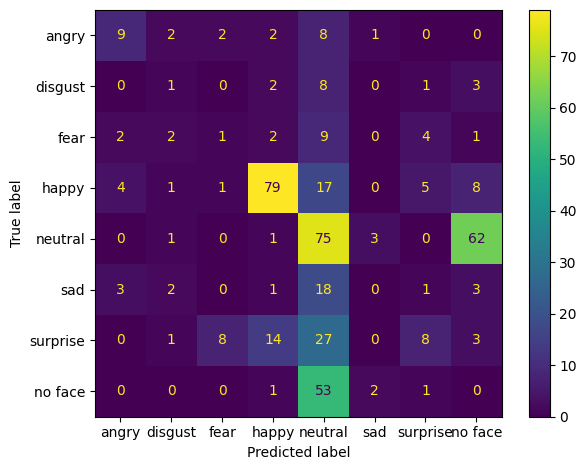

In [58]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

gt_class_ids_for_confusion = combined_class_ids.copy()
gt_class_ids_for_confusion[gt_class_ids_for_confusion==-1] = 7

pred_class_ids_for_confusion = combined_probs.argmax(axis=1)
pred_class_ids_for_confusion[combined_probs.max(axis=1)==0.0] = 7

labels = [*classes, 'no face']

plt.figure(figsize=(15, 15))
ConfusionMatrixDisplay.from_predictions(gt_class_ids_for_confusion, pred_class_ids_for_confusion, display_labels=labels)
plt.tight_layout()

###